In [1]:
#! /usr/bin/env python3

# import argparse 
import glob
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import pickle
from sklearn.preprocessing import quantile_transform as qt
import statsmodels.api as sm
from statsmodels.stats.multitest import fdrcorrection as fdr
from scipy import stats

%matplotlib inline
np.set_printoptions(precision=2, suppress=True, edgeitems=100)

In [2]:
import pandas as pd
import seaborn as sns

In [3]:
matplotlib.rc('font', size=7)
matplotlib.rc('axes', titlesize=7)
matplotlib.rc('xtick', labelsize=5)
matplotlib.rc('ytick', labelsize=5)

In [100]:
# tmp = loadTRxGene()
del tmp

In [101]:
# Helpers
def get2DIQRmask(data, whis=1.5):
    q1s = np.quantile(data, 0.25, axis=1)
    q3s = np.quantile(data, 0.75, axis=1)
    kIQRs = (q3s - q1s) * whis
    return np.logical_or(data < (q1s - kIQRs)[:,None], data > (q3s + kIQRs)[:,None])


def get1DIQRmask(data, whis=1.5):
    q1s = np.quantile(data, 0.25)
    q3s = np.quantile(data, 0.75)
    kIQRs = (q3s - q1s) * whis
    return np.logical_or(data < (q1s - kIQRs), data > (q3s + kIQRs))


# Gene-TR mapping relation
def getSize(f):
    bed = np.loadtxt(f, usecols=[1,2], dtype=int)
    return bed[:,1] - bed[:,0]


def indexLociList():
    lociList = np.loadtxt(args.TRbed, dtype=object, usecols=[0,1,2])
    loci2ind = {}
    for ind, row in enumerate(lociList):
        loci2ind["_".join(row)] = ind
    return lociList, loci2ind


def loadTRxGene(minsup=10):
    TRxGene = np.loadtxt(args.pair, dtype=object, usecols=[5,6,7,3])
    
    nloci29k = nloci - 6 ### XXX
    step1 = pd.read_csv(args.step1, sep="\t", index_col=0)
    nhap = step1.shape[1]
    lens = np.zeros([nloci29k, nhap], dtype=float)
    for i in range(nloci29k):
        lens[i] = step1.loc[f'tr.len.{i}']
    nsup = np.sum(np.isfinite(lens), axis=1)
    idx = np.nonzero(nsup<minsup)[0] + 6
    print(f'{idx.size} loci with #support < {minsup}')
    bloci = ["_".join(v) for v in lociList[idx]]
#     print(pd.DataFrame(bloci))
    mask = ~np.isin(["_".join(v) for v in TRxGene[:,:3]], bloci)
    print(np.sum(~mask), "pairs removed")
    
    return TRxGene[mask]


def indexGeneList(tissue):
    tisGeneList = np.loadtxt(f'{args.expDir}/{tissue}.v8.normalized_expression.bed.gz', dtype=object, skiprows=1, usecols=[3])      
    tisGene2ind = {}
    for ind, gene in enumerate(tisGeneList):
        tisGene2ind[gene] = ind        
    return tisGeneList, tisGene2ind


def indexPairs(tisGene2ind):
    tisGeneMask = np.array([gene in tisGene2ind for gene in TRxGene[:,3]], dtype=bool)
    
    pairs = np.empty([np.sum(tisGeneMask), 2], dtype=object)
    pairs[:,0] = ["_".join(locus) for locus in TRxGene[tisGeneMask,:3]]
    pairs[:,1] = TRxGene[tisGeneMask, 3]

    pairsi = np.array([[loci2ind[locus], tisGene2ind[gene]] for locus, gene in pairs])
    print(f'\t{len(set(pairsi[:,0].tolist()))} TRs')
    print(f'\t{len(set(pairsi[:,1].tolist()))} Genes')
    print(f'\t{pairsi.shape[0]} TR x Gene tests', flush=True)

    genei2nloci = {}
    for locusi, genei in pairsi:
        if genei not in genei2nloci:
            genei2nloci[genei] = 1
        else:
            genei2nloci[genei] += 1
    print(f'\t{np.mean(list(genei2nloci.values())):.1f} tests per gene', flush=True) # XXX not equal to TRs/Genes !??
    
    return pairs, pairsi, genei2nloci
            

# expression matrix
def loadSNPPCinfo():
    if args.SNPPC is None:
        return None, None

    ndim = 838 # XXX
    tmp = np.loadtxt(args.SNPPC, usecols=np.arange(11), dtype=object)[:ndim] # XXX
    SNP_PCs = tmp[:,1:].astype(float)
    SNP_sampleList = [s.split("-")[-1] for s in tmp[:,0]]
    return SNP_PCs, SNP_sampleList


def getTisSNPResTpmMat(tissue, SNP_PCs, SNP_sampleList):
    # SNP PCs
    tmp = np.loadtxt(f'{args.expDir}/{tissue}.v8.normalized_expression.bed.gz', dtype=object, max_rows=1, comments="!")[4:]    
    tisSampleList = np.array([s[5:] for s in tmp])

    snpSample2ind = {}
    for sind, sample in enumerate(SNP_sampleList):
        snpSample2ind[sample] = sind

    sampleMap_tis2snp = np.zeros(tisSampleList.size, dtype=int)
    for ind in range(tisSampleList.size):
        sampleMap_tis2snp[ind] = snpSample2ind[tisSampleList[ind]]

    tisSNP_PCs = SNP_PCs[sampleMap_tis2snp]
    
    # GTEx PCs
    gtexPCs = np.loadtxt(f'{args.covDir}/{tissue}.v8.covariates.txt', dtype=object, skiprows=1)[:,1:].astype(float).T   
    
    C = np.hstack((gtexPCs, tisSNP_PCs))
    tisTpmMat = np.loadtxt(f'{args.expDir}/{tissue}.v8.normalized_expression.bed.gz', dtype=object, skiprows=1)[:,4:].astype(float).T        
    tisResTpmMat = (np.eye(C.shape[0]) - C @ np.linalg.inv(C.T @ C) @ C.T) @ tisTpmMat
    return tisResTpmMat.T


# genotype matrix
def getGenotypeMat(skip=0):
    genMat = np.zeros([nloci, nwgs], dtype=float)
    kmerfnames = sorted(glob.glob(f'{args.genDir}/*.tr.kmers'))
    for fi, fname in enumerate(kmerfnames):
        print(".", end='', flush=True)
        if fi % 100 == 99: print("")
        with open(fname) as f:
            locusi = -1 - skip
            kms = 0
            for line in f:
                if line[0] == ">":
                    if locusi >= 0:
                        genMat[locusi, fi] = kms
                        kms = 0
                    locusi += 1
                else:
                    kms += int(line.split()[1])
            else:
                genMat[locusi, fi] = kms
    print("done reading genotypes", flush=True)
    return genMat


def processBamCov(covmat, whis=1.5):
    ctrlsize = getSize(args.ctrlbed)
    badmask = np.zeros_like(ctrlsize, dtype=bool)

    ### compute coverage for each locus; normalize wrt sample global coverage
    normcovmat = covmat / (covmat@ctrlsize / np.sum(ctrlsize))[:,None]

    ### check variance
    stds = np.std(normcovmat, axis=0)
    badmask = np.logical_or(badmask, get1DIQRmask(stds))

    ### check if mean is biased
    means = np.mean(normcovmat, axis=0)
    badmask = np.logical_or(badmask, get1DIQRmask(means))

    print(f'\t{np.sum(badmask)} out of {badmask.size} unique regions removed')
        
    ### reject outliers
    pctrlsize = ctrlsize[~badmask]
    pcovmat = covmat[:,~badmask]
    return pcovmat@pctrlsize / np.sum(pctrlsize)


def correctGenMat(genMat):
    gtexSex = np.loadtxt(args.phenotype, dtype=object, usecols=[0,1])[1:]    
    sample2sex = {}
    for i in range(gtexSex.shape[0]):
        sample = gtexSex[i,0].split("-")[1]
        sample2sex[sample] = int(gtexSex[i,1])
    
    wgsSex = np.zeros_like(genomes, dtype=int)
    for ind, g in enumerate(genomes):
        wgsSex[ind] = sample2sex[g]
        
    if args.ctrlcov:
        covmat = np.loadtxt(args.ctrlcov, dtype=object)
    else:
        covmat = np.loadtxt(f'{args.outDir}/ctrl.cov', dtype=object)
    gcov = processBamCov(covmat[:,2:].astype(float))
    
    normGenMat = genMat / gcov
    normGenMat[:args.NL1] /= 2
    normGenMat[args.NL1:args.NL2] /= wgsSex
    
    outlierMask = get2DIQRmask(normGenMat)

    return normGenMat, ~outlierMask


def getTissueGenMat(tissue):
    tmp = np.loadtxt(f'{args.expDir}/{tissue}.v8.normalized_expression.bed.gz', dtype=object, max_rows=1, comments="!")[4:]
    tisSampleList = np.array([s[5:] for s in tmp])        
    mask = np.isin(genomes, tisSampleList)
    
    return genMat[:,mask], gmMask[:,mask]


# eQTL mapping
def runRegressionZ5(tisResTpmMat, tisGenMat, tisGenMask, pairsi, genei2nloci):
    """reject outliers in genotypes + qunatile normalize genotypes"""
    pairstats = np.full([pairsi.shape[0], 5], np.nan) # lead_TR, lead_p_nominal, p_nominal, slope, slope_se
    pairstats[:,0] = False
    nvar = np.zeros(pairsi.shape[0])
    leadP = {}
    
    for pi, (locusi, genei) in enumerate(pairsi):
        nvar[pi] = genei2nloci[genei]
        
        genos = tisGenMat[locusi, tisGenMask[locusi]]
        exps = tisResTpmMat[genei, tisGenMask[locusi]]
        xs, ys = genos, exps
        xs = (xs - np.mean(xs)) / np.std(xs)
        ys = (ys - np.mean(ys)) / np.std(ys)
            
        if not np.any(genos): print("-", end=""); continue
        if not np.all(np.isfinite(xs)): print(".", end=""); continue
        if not np.all(np.isfinite(ys)): print(".", end=""); continue
                
        results = sm.OLS(ys, sm.add_constant(xs, prepend=True)).fit()
        p = results.pvalues[1]
        b = results.params[1]
        bse = results.bse[1]
        pairstats[pi,2:] = [p, b, bse]
        if genei not in leadP:
            leadP[genei] = (p, pi)
        else:
            if p < leadP[genei][0]:
                leadP[genei] = (p, pi)
        
    for genei, (pmin, pi) in leadP.items():
        cisMask = pairsi[:,1] == pairsi[pi,1]
        pairstats[cisMask, 1] = pmin
        pairstats[pi,0] = True
        
    leadP_Bonf = (pairstats[:,2] * nvar)[pairstats[:,0].astype(bool)] # Bonferroni correction
        
    print("")
    return pairstats, leadP_Bonf


def annotateGeneTR1(allGeneInfo, allTRinfo, gene2allind, genei2nloci, pairs, pairsi, pairstats, rejected, qval):
    fulltbl = np.empty([pairs.shape[0], 17], dtype=object)
    
    fulltbl[:,:5] = np.array([allGeneInfo[gene2allind[gene]] for gene in pairs[:,1]], dtype=object) # gene_id, gene_name, chr, start, end
    fulltbl[:,5] = np.array([genei2nloci[genei] for genei in pairsi[:,1]], dtype=object) # num_var
    fulltbl[:,6:9] = allTRinfo[pairsi[:,0]] # TR_chr, TR_start, TR_end
    fulltbl[:,9] = pairsi[:,0] # TR_locus
    fulltbl[:,10] = False # eTR
    fulltbl[:,10][pairstats[:,0].astype(bool)] = rejected
    fulltbl[:,11] = pairstats[:,0].astype(bool) # lead_TR
    fulltbl[:,12:16] = pairstats[:,1:] # lead_p_nominal, p_nominal, slope, slope_se
    fulltbl[:,16] = np.nan # qval
    fulltbl[:,16][pairstats[:,0].astype(bool)] = qval

    srti = np.argsort(fulltbl[:,9])
    return fulltbl[srti]


def singleTissue_eQTL(tissue, SNP_PCs, SNP_sampleList, allGeneInfo, allTRinfo, gene2allind, fdr_cutoff=0.05):
    # establish mapping between TRs and Genes
    tisGeneList, tisGene2ind = indexGeneList(tissue)
    pairs, pairsi, genei2nloci = indexPairs(tisGene2ind) # count # of TRs mapped to each gene; used for Bonferroni correction

    tisGenMat, tisGenMask = getTissueGenMat(tissue) # genMat with samples missing in tpmMat removed
    print(f'\ttisGenMat {tisGenMat.shape}')

    if glob.glob(f'{args.resDir}/{tissue}.ResMat.pickle'):
        tisResTpmMat = pickle.load(open(f'{args.resDir}/{tissue}.ResMat.pickle', 'rb'))
    else:
        tisResTpmMat = getTisSNPResTpmMat(tissue, SNP_PCs, SNP_sampleList)
        pickle.dump(tisResTpmMat, open(f'{args.outDir}/{tissue}.ResMat.pickle', 'wb'))
    print(f'\ttisResTpmMat {tisResTpmMat.shape}')

    pairstats, leadP_Bonf = runRegressionZ5(tisResTpmMat, tisGenMat, tisGenMask, pairsi, genei2nloci) # [genei, locusi], [p, b, bse]
    rejected, qval = fdr(leadP_Bonf, alpha=fdr_cutoff)
    print(f'\t{np.sum(rejected)} tissue eGenes')

    fulltbl = annotateGeneTR1(allGeneInfo, allTRinfo, gene2allind, genei2nloci, pairs, pairsi, pairstats, rejected, qval)

    return fulltbl


def writeAlleGeneTR(fdr_cutoff=0.05):
    allGeneInfo = np.loadtxt(args.geneBed, dtype=object)[:,[3,4,0,1,2]]
    allGeneInfo[:,3:] = allGeneInfo[:,3:].astype(int)
    
    gene2allind = {}
    for i in range(allGeneInfo.shape[0]):
        gene2allind[allGeneInfo[i,0]] = i
        
    allTRinfo = np.loadtxt(args.TRbed, dtype=object, usecols=[0,1,2])
    allTRinfo[:,1:] = allTRinfo[:,1:].astype(int)
    
    SNP_PCs, SNP_sampleList = loadSNPPCinfo()
    tissues = np.loadtxt(args.tissues, dtype=object)
    
    for tissue in tissues:
        print("tissue: {}".format(tissue))
        
        fulltbl = singleTissue_eQTL(tissue, SNP_PCs, SNP_sampleList, allGeneInfo, allTRinfo, gene2allind, fdr_cutoff)
        
        np.savetxt(f'{args.outDir}/{tissue}.v8.allGenes.txt', fulltbl, delimiter="\t", 
                   header="gene_id\tgene_name\tchr\tstart\tend\tnum_var\tTR_chr\tTR_start\tTR_end\tTR_locus\teTR\tlead_TR\tlead_p_nominal\tp_nominal\tslope\tslope_se\tqval",
                   fmt=['%s','%s','%s','%i','%i','%i','%s','%i','%i','%i','%s','%s','%.4e','%.4e','%.4e','%.4e','%.4e'])
        
        fulltbl = fulltbl[fulltbl[:,10].astype(bool)]
        np.savetxt(f'{args.outDir}/{tissue}.v8.egenes.txt', fulltbl, delimiter="\t", 
                   header="gene_id\tgene_name\tchr\tstart\tend\tnum_var\tTR_chr\tTR_start\tTR_end\tTR_locus\teTR\tlead_TR\tlead_p_nominal\tp_nominal\tslope\tslope_se\tqval",
                   fmt=['%s','%s','%s','%i','%i','%i','%s','%i','%i','%i','%s','%s','%.4e','%.4e','%.4e','%.4e','%.4e'])

In [68]:
def runRegressionP1(topResTpmMat, topGenMat, topGenMask, ntrial):
    out = []
    for pi in range(topResTpmMat.shape[0]):
        xs = topResTpmMat[pi, topGenMask[pi]]
        ys = topGenMat[pi, topGenMask[pi]]
        if not np.any(xs): print("-", end=""); continue
        
        xs = (xs - np.mean(xs)) / np.std(xs)
        ys = (ys - np.mean(ys)) / np.std(ys)
        if not np.all(np.isfinite(xs)): print(".", end=""); continue
        if not np.all(np.isfinite(ys)): print(".", end=""); continue
            
        out.append([])
        for ti in range(ntrial):
            randi = np.random.permutation(ys.size)
            ys = ys[randi]
            results = sm.OLS(ys, sm.add_constant(xs, prepend=True)).fit()
            if len(results.pvalues) < 2:
                print(pi, xs, ys, results.pvalues)
            out[-1].append(results.pvalues[1])
                
    print("")
    return np.mean(out, axis=1)

def ctrleQTLv1():
    results = {}
    for tissue in np.loadtxt(args.tissues, dtype=object):
        print(f'tissue {tissue}')
        
        ### indexing
        _, tisGene2ind = indexGeneList(tissue)
        _, pairsi, _ = indexPairs(tisGene2ind)

        ### load top pairs
        topq = 0.05
        nominalP = np.loadtxt(f'{args.outDir}/{tissue}.v8.allGenes.txt', usecols=13)
        mask = nominalP < np.quantile(nominalP[np.isfinite(nominalP)], topq)
        npair = np.sum(mask)
        pairsi = pairsi[mask]

        ### load top genotype, expression matrix
        topGenMat, topGenMask = getTissueGenMat(tissue)
        topGenMat, topGenMask = topGenMat[pairsi[:,0].astype(int)], topGenMask[pairsi[:,0].astype(int)]
        print(f'\ttop GenMat {topGenMat.shape}')
        topResTpmMat = pickle.load(open(f'{args.resDir}/{tissue}.ResMat.pickle', 'rb'))[pairsi[:,1].astype(int), :]
        print(f'\ttop ResTpmMat {topResTpmMat.shape}')

        ### generate ctrl P by permutating top X% pairs
        ctrlP = runRegressionP1(topResTpmMat, topGenMat, topGenMask, 1)
        
        results[tissue] = (nominalP, ctrlP)

    return results
        
def visQQ(fibroblast=True):
    if fibroblast:
        tissues = np.array(["Lung", "Adipose_Visceral_Omentum", "Skin_Not_Sun_Exposed_Suprapubic", "Brain_Frontal_Cortex_BA9", "Artery_Aorta", "Thyroid", "Adipose_Subcutaneous", "Brain_Cerebellum", "Whole_Blood", "Muscle_Skeletal", "Artery_Tibial", "Skin_Sun_Exposed_Lower_leg", "Nerve_Tibial", "Spleen", "Small_Intestine_Terminal_Ileum", "Cells_Cultured_fibroblasts"])    
        labels = np.array(["Lung", "Adipose visceral", "Skin unexposed", "Cortex", "Artery aorta", "Thyroid", "Adipose subcutaneous", "Cerebellum", "Blood", "Muscle", "Artery tibial", "Skin exposed", "Nerve", "Spleen", "Small intestine", "Fibroblasts"])    
    else:
        tissues = np.array(["Esophagus_Mucosa", "Esophagus_Muscularis", "Lung", "Adipose_Visceral_Omentum", "Skin_Not_Sun_Exposed_Suprapubic", "Brain_Frontal_Cortex_BA9", "Artery_Aorta", "Thyroid", "Adipose_Subcutaneous", "Brain_Cerebellum", "Whole_Blood", "Muscle_Skeletal", "Artery_Tibial", "Skin_Sun_Exposed_Lower_leg", "Nerve_Tibial", "Spleen", "Small_Intestine_Terminal_Ileum"])    
        labels = np.array(["E. mucosa", "E. muscularis", "Lung", "Adipose visceral", "Skin unexposed", "Cortex", "Artery aorta", "Thyroid", "Adipose subcutaneous", "Cerebellum", "Blood", "Muscle", "Artery tibial", "Skin exposed", "Nerve", "Spleen", "Small intestine"])    
    srti = np.argsort(tissues)
    tissues = tissues[srti]
    labels = labels[srti]
    
    
    plt.figure(dpi=600, figsize=(3.5,2.6))
    cmap=plt.get_cmap('tab20')
    carr = [cmap(v) for v in range(tissues.size)]
    
    ctrlP = None
    for ti, tissue in enumerate(tissues):
        ctrlP = results[tissue][1] if ctrlP is None else np.concatenate((ctrlP, results[tissue][1]))
        x = -np.log10(np.sort(np.random.uniform(size=results[tissue][0].size)))
        ps = -np.log10(np.sort(results[tissue][0]))

        plt.plot(x, ps, '.', mew=0, label=labels[ti], markersize=3, c=carr[ti])

    x = -np.log10(np.sort(np.random.uniform(size=ctrlP.size)))
    ps = -np.log10(np.sort(ctrlP))
    plt.plot(x, ps, '.k', mew=0, label="Permuted", markersize=3)
    plt.plot([0,5], [0,5], '-r', lw=0.5)
    
    plt.legend(loc='best', bbox_to_anchor=(0., 0.1, 0.4, 0.9), fontsize=4.5, frameon=False)
    plt.xlabel("Expected P value ($-log_{10} P$)")
    plt.ylabel("Observed P value ($-log_{10} P$)")
    plt.show(); plt.close()

### merge results with those from 29k loci

In [9]:
genomes = np.loadtxt(args.genomes, dtype=object)

In [ ]:
def mergeBed():
    print("merging bed")
    bed0 = np.loadtxt("/home/cmb-17/mjc/vntr_genotyping/clinicGraph/input/clinic.bed", dtype=object)
    bed1 = np.loadtxt("/home/cmb-17/mjc/vntr_genotyping/rpgg_k21_29k/input/tr.good.bed", dtype=object)
    bed = np.vstack((bed0,bed1))
    np.savetxt("/home/cmb-17/mjc/vntr_genotyping/clinicGraph/eqtl/input/clinic_29k.bed", bed, fmt='%s', delimiter="\t")

In [ ]:
# mergeBed()

In [27]:
def getGenotypeMat(genDir, nloci, nwgs, skip=0):
    genMat = np.zeros([nloci, nwgs], dtype=float)
    kmerfnames = sorted(glob.glob(f'{genDir}/*.tr.kmers'))
    for fi, fname in enumerate(kmerfnames):
        print(".", end='', flush=True)
        if fi % 100 == 99: print("")
        with open(fname) as f:
            locusi = -1 - skip
            kms = 0
            for line in f:
                if line[0] == ">":
                    if locusi >= 0:
                        genMat[locusi, fi] = kms
                        kms = 0
                    locusi += 1
                else:
                    kms += int(line.split()[1])
            else:
                genMat[locusi, fi] = kms
    print("done reading genotypes", flush=True)
    return genMat

def mergeGenMat():
    genomes = np.loadtxt("/home/cmb-17/mjc/vntr_genotyping/gtex/genotype/genomes.txt", dtype=object)
    nwgs = genomes.size
    nloci = np.loadtxt("/home/cmb-17/mjc/vntr_genotyping/clinicGraph/eqtl/input/clinic_29k.bed", usecols=1).size

    if glob.glob(f'{args.outDir}/rawGenotype.pickle'):
        genMat = pickle.load(open(f'{args.outDir}/rawGenotype.pickle', 'rb'))
    else:
        print("reading raw genotypes")
        #genDir = "/home/cmb-17/mjc/vntr_genotyping/clinicGraph/eqtl/genotype"
        genMat0 = getGenotypeMat(args.genDir, 6, nwgs)
        genMat1 = pickle.load(open(f'/home/cmb-17/mjc/vntr_genotyping/rpgg_k21_29k/eqtl/output/rawGenotype.pickle', 'rb'))
        genMat = np.vstack((genMat0,genMat1))
        pickle.dump(genMat, open(f'{args.outDir}/rawGenotype.pickle', 'wb'))

    print("correcting genotypes")
    genMat, gmMask = correctGenMat(genMat)
    pickle.dump([genMat, gmMask], open(f'{args.outDir}/normedGenotype.pickle', 'wb'))

In [27]:
# mergeGenMat()

reading raw genotypes
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
...............................................................................done reading genotypes
correcting genotypes
	2 out of 16 unique regions removed


In [14]:
expmat_fibroblast = np.loadtxt("/home/cmb-17/mjc/vntr_genotyping/gtex/expression/GTEx_Analysis_v8_eQTL_expression_matrices/Cells_Cultured_fibroblasts.v8.normalized_expression.bed.gz", dtype=object)[:,4:].astype(float)    

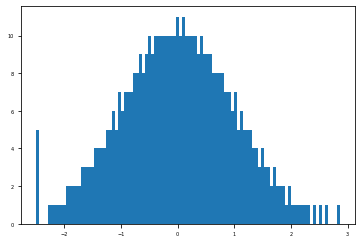

In [18]:
def test():
    plt.hist(expmat_fibroblast[3], bins=100)
    plt.show(); plt.close()
test()

# ksize = 21

In [65]:
class Args:
    def __init__(self):
        self.TRbed = "/home/cmb-17/mjc/vntr_genotyping/clinicGraph/eqtl/input/clinic_29k.bed"
        self.geneBed = "/home/cmb-17/mjc/vntr_genotyping/gtex/expression/genes_id_name.bed"
        self.pair = "/home/cmb-17/mjc/vntr_genotyping/gtex/eqtl/gene.100k_window.tr_clinic.pair.bed" # regenerated for clinic_29k
        self.expDir = "/home/cmb-17/mjc/vntr_genotyping/gtex/eqtl/input/GTEx_Analysis_v8_eQTL_expression_matrices"
        self.resDir = "/home/cmb-17/mjc/vntr_genotyping/clinicGraph/eqtl/output"
        self.genDir = "/home/cmb-17/mjc/vntr_genotyping/clinicGraph/eqtl/genotype"
        self.covDir = "/home/cmb-17/mjc/vntr_genotyping/gtex/eqtl/input/GTEx_Analysis_v8_eQTL_covariates"
        self.outDir = "/home/cmb-17/mjc/vntr_genotyping/clinicGraph/eqtl/output"
        self.phenotype = "/home/cmb-17/mjc/vntr_genotyping/gtex/eqtl/input/GTEx_Analysis_v8_Annotations_SubjectPhenotypesDS.txt"
        self.genomes = "/home/cmb-17/mjc/vntr_genotyping/gtex/genotype/genomes.txt"
        self.tissues = "/home/cmb-17/mjc/vntr_genotyping/gtex/eqtl/input/GTEx_Analysis_v8_eQTL_expression_matrices/alltissue.txt"
        self.genMat = "/home/cmb-17/mjc/vntr_genotyping/clinicGraph/eqtl/output/normedGenotype.pickle"
        self.NL1 = 28101+6
        self.NL2 = 29052+6
        self.SNPPC = "/home/cmb-17/mjc/vntr_genotyping/gtex/variation/joint.pca.evec"
        self.ctrlbed = "/home/cmb-17/mjc/vntr_genotyping/cmb-16/work/vntr/hapdb/a1_regions/ctrl/pan.fn0.bed.bak"
        self.ctrlcov = "/home/cmb-17/mjc/vntr_genotyping/rpgg_k21_29k/eqtl/output/ctrl.cov"
        self.step1 = "/home/cmb-17/mjc/vntr_genotyping/rpgg_k21_29k/output/analysis/step1.csv"
        
args = Args()

In [103]:
genomes = np.loadtxt(args.genomes, dtype=object)
nwgs = genomes.size
nloci = np.loadtxt(args.TRbed, usecols=[1]).size

lociList, loci2ind = indexLociList()

TRxGene = loadTRxGene()

if args.genMat:
    print("reading genotype pickle")
    genMat, gmMask = pickle.load(open(args.genMat, 'rb'))
else:
    if glob.glob(f'{args.outDir}/rawGenotype.pickle'):
        genMat = pickle.load(open(f'{args.outDir}/rawGenotype.pickle', 'rb'))
    else:
        print("reading raw genotypes")
        genMat = getGenotypeMat()
        pickle.dump(genMat, open(f'{args.outDir}/rawGenotype.pickle', 'wb'))

    print("correcting genotypes")
    genMat, gmMask = correctGenMat(genMat)
    pickle.dump([genMat, gmMask], open(f'{args.outDir}/normedGenotype.pickle', 'wb'))

652 loci with #support < 10
3193 pairs removed
reading genotype pickle


In [76]:
pd.DataFrame(genMat)

,0,1,2,3,4,5,6,7,8,9,...,869,870,871,872,873,874,875,876,877,878
0,1528.497595,1617.159603,1193.222940,1231.143197,1156.314501,1239.402650,1093.652951,2023.768690,1336.890589,1131.097585,...,2032.890453,996.586489,1507.686813,1295.112058,1292.202442,2421.480770,2052.834094,1722.639153,1322.483400,1927.884055
1,77.598929,42.200099,49.185738,45.159838,56.125564,53.099065,33.245215,38.218065,52.332313,34.475195,...,46.861905,16.550967,50.298947,34.956591,34.675529,26.951683,44.388387,52.975299,41.836503,58.820057
2,51.695922,42.279095,32.989587,28.029736,20.040692,29.081585,21.271843,23.969561,27.777236,18.238862,...,27.516050,25.252559,28.454257,36.541487,29.120856,35.008751,47.112053,38.371297,31.140393,42.272980
3,208.356428,244.842729,199.882171,177.531482,151.489611,219.859150,153.530906,156.486817,247.342398,138.203321,...,176.374088,141.199034,206.048563,150.935448,190.925018,203.843827,191.171877,269.232072,209.847483,243.073572
4,69.986874,82.583271,79.369473,65.869144,58.799594,79.737441,36.740987,38.723856,71.984707,75.937632,...,55.805351,58.264786,50.010948,63.603220,74.231982,76.968699,137.673933,105.920455,68.689963,122.457817
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29112,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
29113,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
29114,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
29115,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [38]:
def outputGenMatTbl():
    header = "Each row is a locus; first 6 are disease loci + remaining 29111\n" +\
             "Each column is a GTEx sample"
    np.savetxt("/home/cmb-17/mjc/vntr_genotyping/danbing-tk/table/clinic_29K.gtex.akms.tbl", genMat,
               fmt='%s', delimiter="\t", header=header)
# outputGenMatTbl()

In [20]:
def visSinglePair(pairinfo):
    tissue, geneid, genename, locus, locusi, pval, slope = pairinfo[:-1]
    locusi = int(locusi)
    pval, slope = float(pval), float(slope)

    (tisGeneList, tisGene2ind), tisResTpmMat, (tisGenMat, tisGenMask) = indexGeneList(tissue), pickle.load(open(f'{args.resDir}/{tissue}.ResMat.pickle', 'rb')), getTissueGenMat(tissue)
    genei = tisGene2ind[geneid]
    
    genos = tisGenMat[locusi, tisGenMask[locusi]]
#     genos = (genos - np.mean(genos)) / np.std(genos)    

    exps = tisResTpmMat[genei, tisGenMask[locusi]]
    exps = (exps - np.mean(exps)) / np.std(exps)    
    
    b0, b1 = sm.OLS(exps, sm.add_constant(genos, prepend=True)).fit().params
    xmin, xmax = min(genos), max(genos)
    ymin, ymax = b0+b1*xmin, b0+b1*xmax
    
    plt.figure(figsize=(2.2, 1.6), dpi=600)    
    plt.plot(genos, exps, '.k', alpha=0.5, markersize=1)
    plt.plot([xmin, xmax], [ymin, ymax], '--r', lw=1)
    plt.title(f'{tissue}\n{locus}, {genename}\np={pval:.1e} b={slope:.2f}')
    plt.xlabel("TR dosage")
    plt.ylabel("Normalized expression")
    plt.show(); plt.close()

In [109]:
def loadePair(fname):
    tbl = pd.read_csv(fname, sep="\t", usecols=[1,2,3,8,9,10,11,15,16])
    epairsi = {}
    epairs = []
    epi = 0
    for i in range(tbl.shape[0]):
        tissue, geneid, genename, chrom, start, end, locusi, pval, slope = tbl.iloc[i]
        locus = f'{chrom}:{start}-{end}'
        pname = (geneid, locus)
        if pname in epairsi:
            epairs[epairsi[pname]][-1] += 1
        else:
            epairsi[pname] = epi
            epairs.append([tissue, geneid, genename, locus, locusi, pval, slope, 1])
            epi += 1            
    print(epi)
    return np.array(epairs)

In [110]:
epairs = loadePair("/home/cmb-17/mjc/vntr_genotyping/clinicGraph/eqtl/output/Alltissue.egenes.filter.csv")

503


In [117]:
pd.DataFrame(epairs[:20])

,0,1,2,3,4,5,6,7
0,Whole_Blood,ENSG00000168903.8,BTNL3,chr5:180986484-180986608,21968,3.6125999999999996e-72,-0.62173,29
1,Whole_Blood,ENSG00000113303.11,BTNL8,chr5:180986484-180986608,21968,2.2632999999999998e-66,0.60111,21
2,Whole_Blood,ENSG00000026297.15,RNASET2,chr6:166997607-166997910,23486,8.2782e-52,-0.54162,15
3,Testis,ENSG00000196115.13,ADAM5,chr8:39503689-39503863,26068,8.1577e-51,0.71382,1
4,Testis,ENSG00000197475.11,ADAM3A,chr8:39503689-39503863,26068,9.410499999999998e-50,0.7084600000000001,1
5,Testis,ENSG00000254067.2,RP11-122L4.2,chr8:39503689-39503863,26068,2.9932e-42,-0.66677,1
6,Skin_Sun_Exposed_Lower_leg,ENSG00000189306.10,RRP7A,chr22:42546989-42547432,16467,1.4606999999999997e-36,0.49013999999999996,44
7,Whole_Blood,ENSG00000159625.14,DRC7,chr16:57693733-57693863,9381,4.1148e-36,-0.4599,1
8,Muscle_Skeletal,ENSG00000224769.1,MUC20P1,chr3:195717039-195717263,18365,2.2168e-33,0.43598000000000003,31
9,Thyroid,ENSG00000236848.2,RPL23AP95,chr7:103160090-103160955,24751,4.7226999999999994e-32,0.47793,1


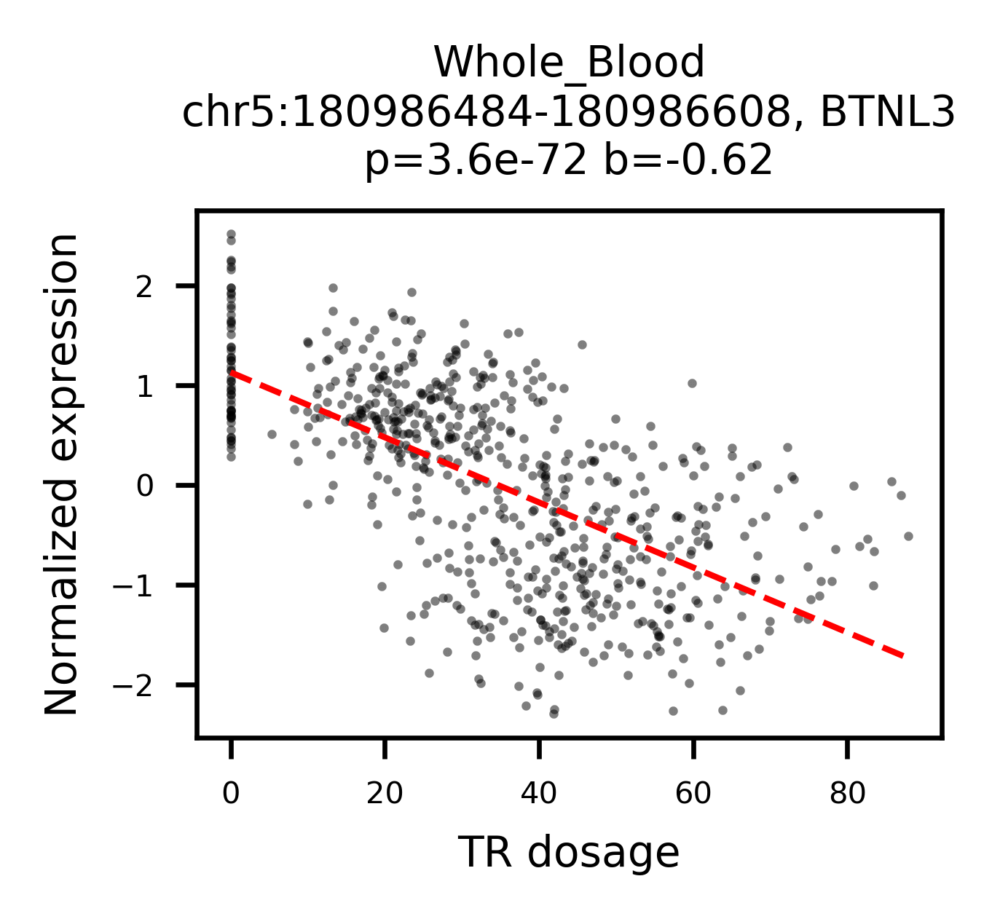

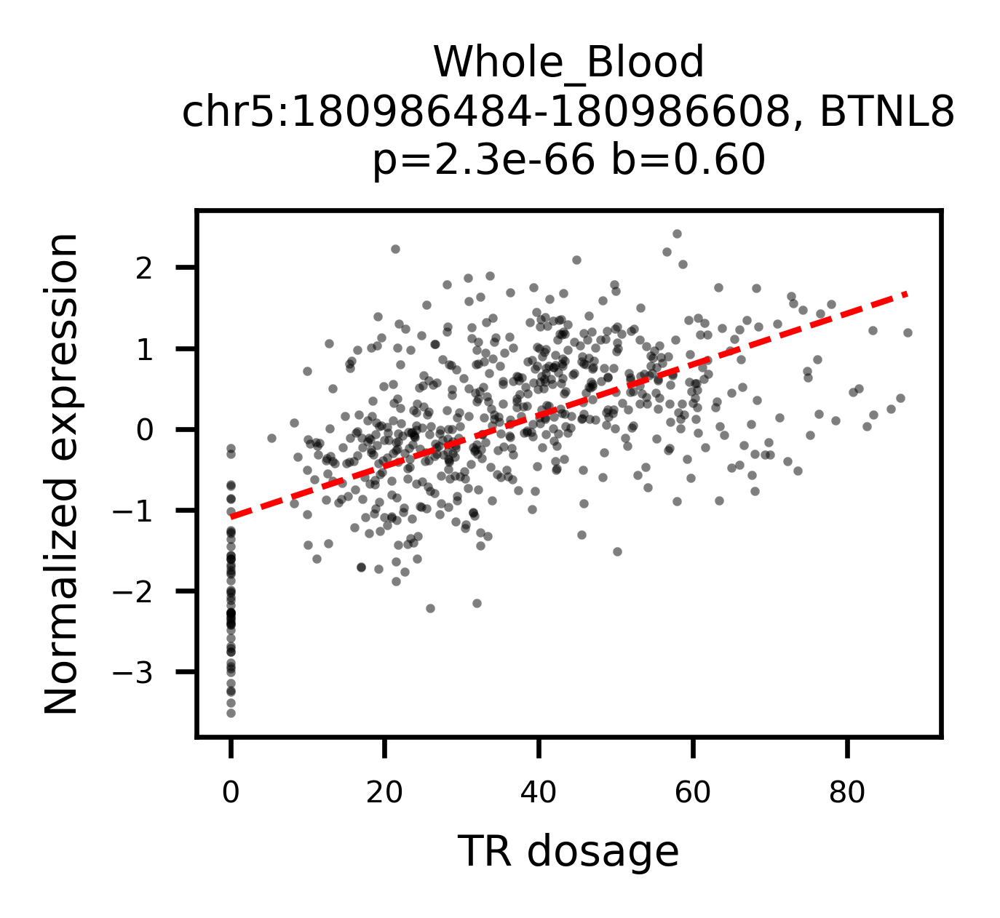

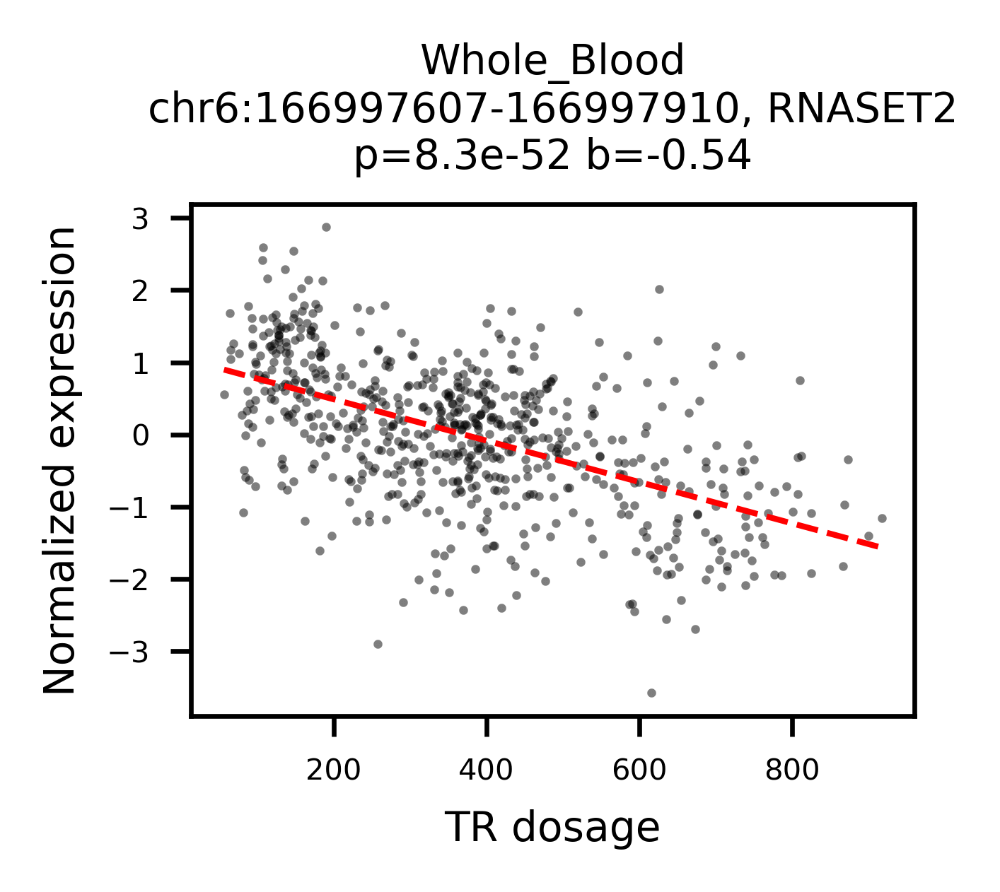

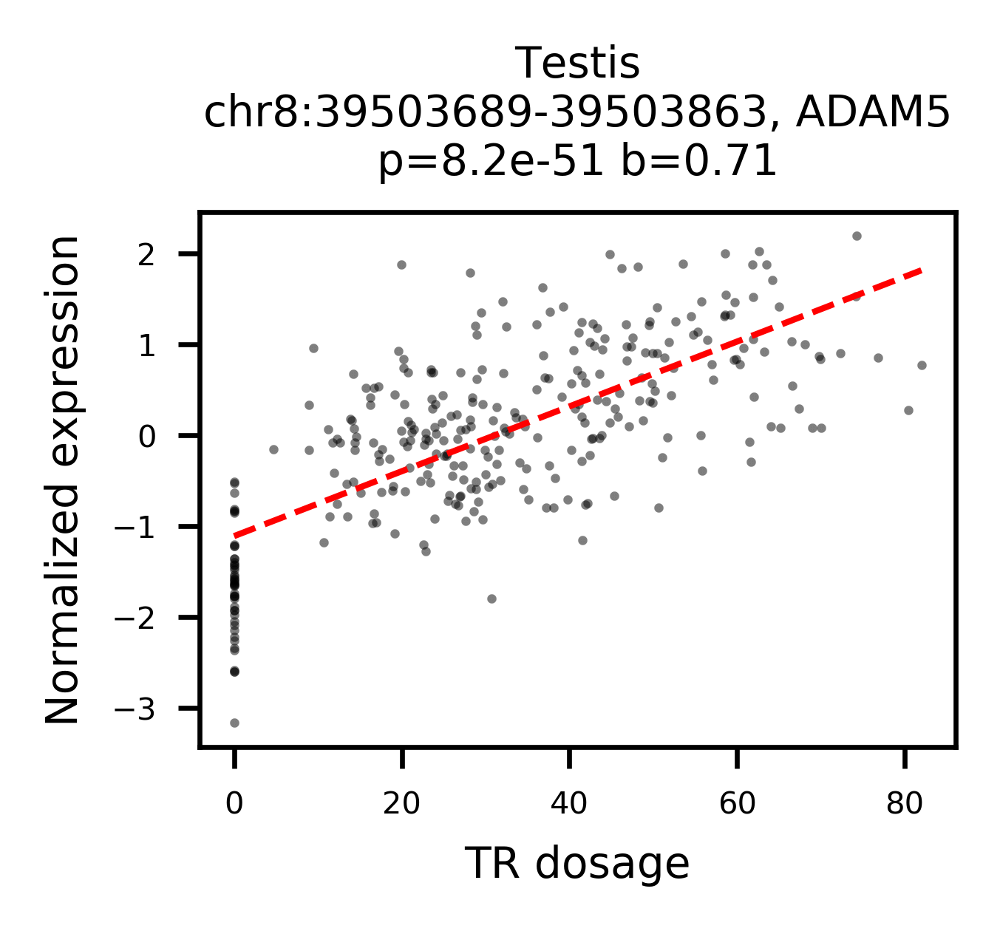

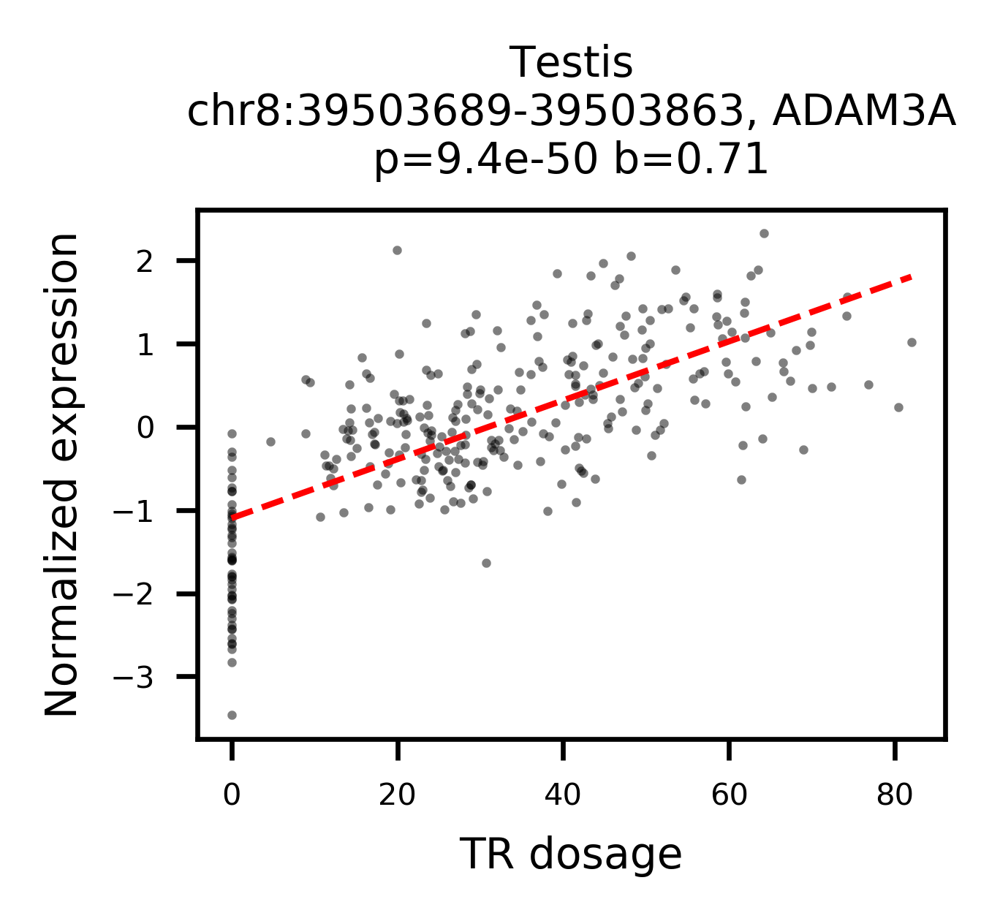

...

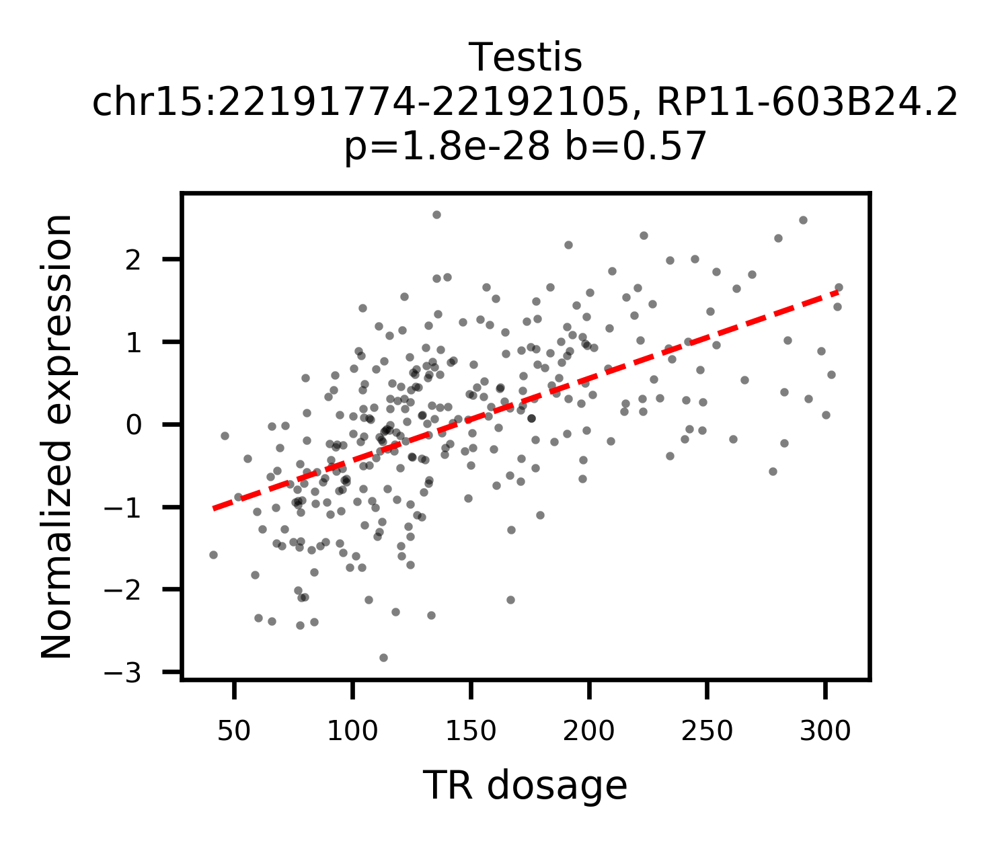

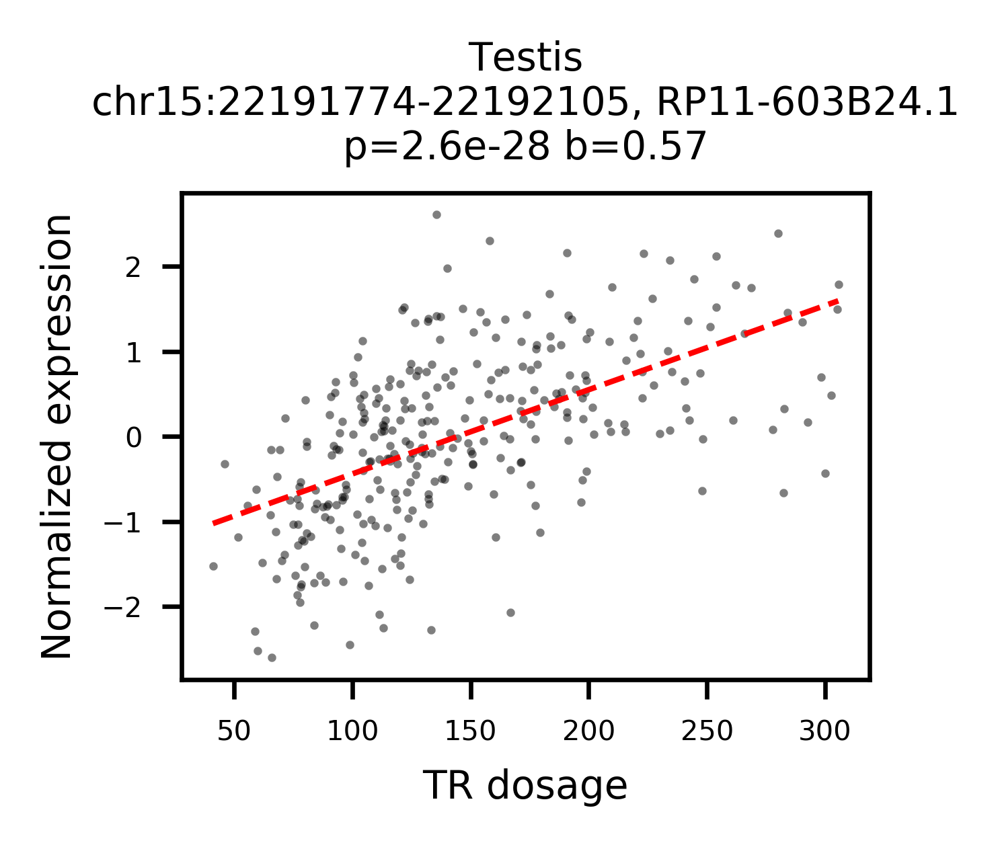

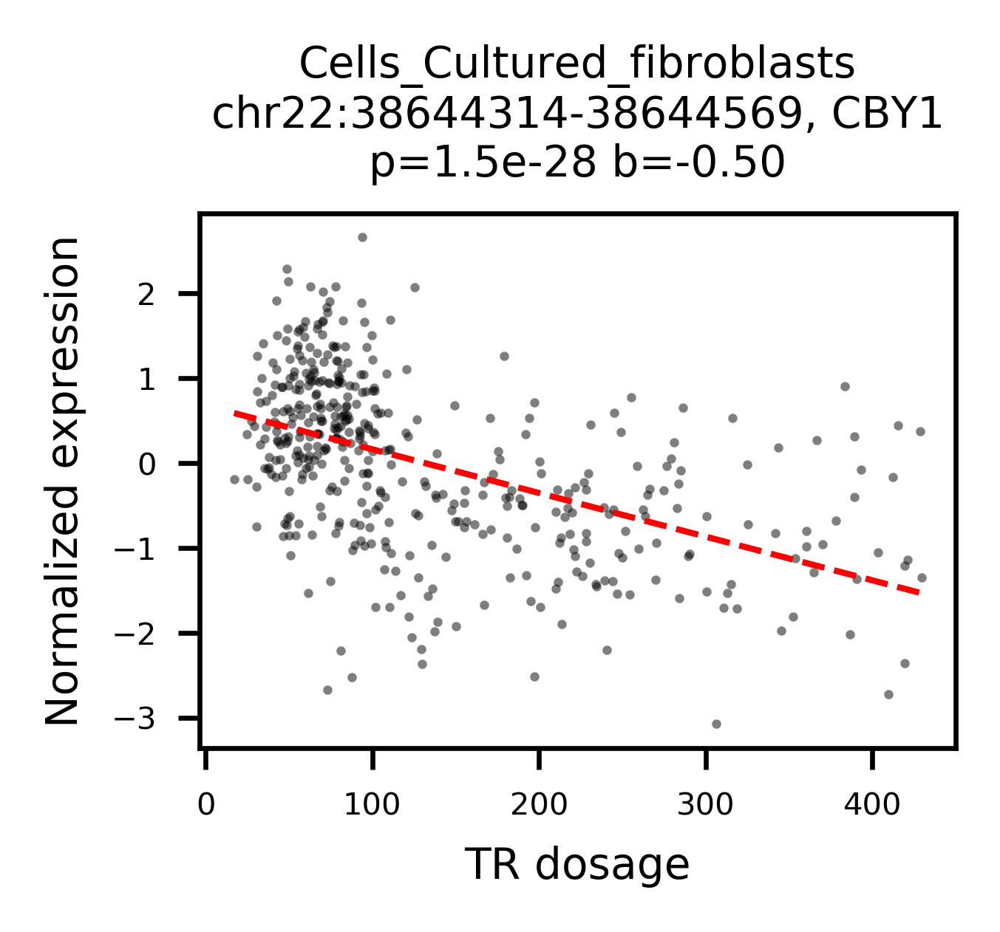

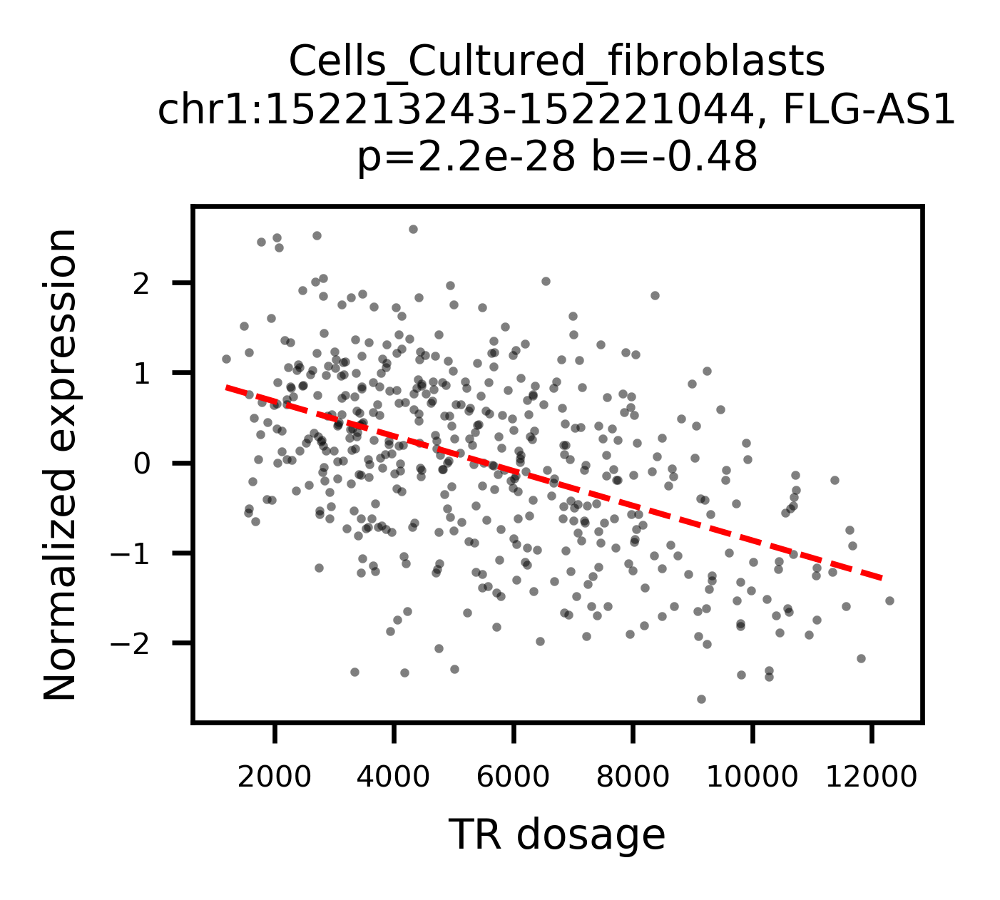

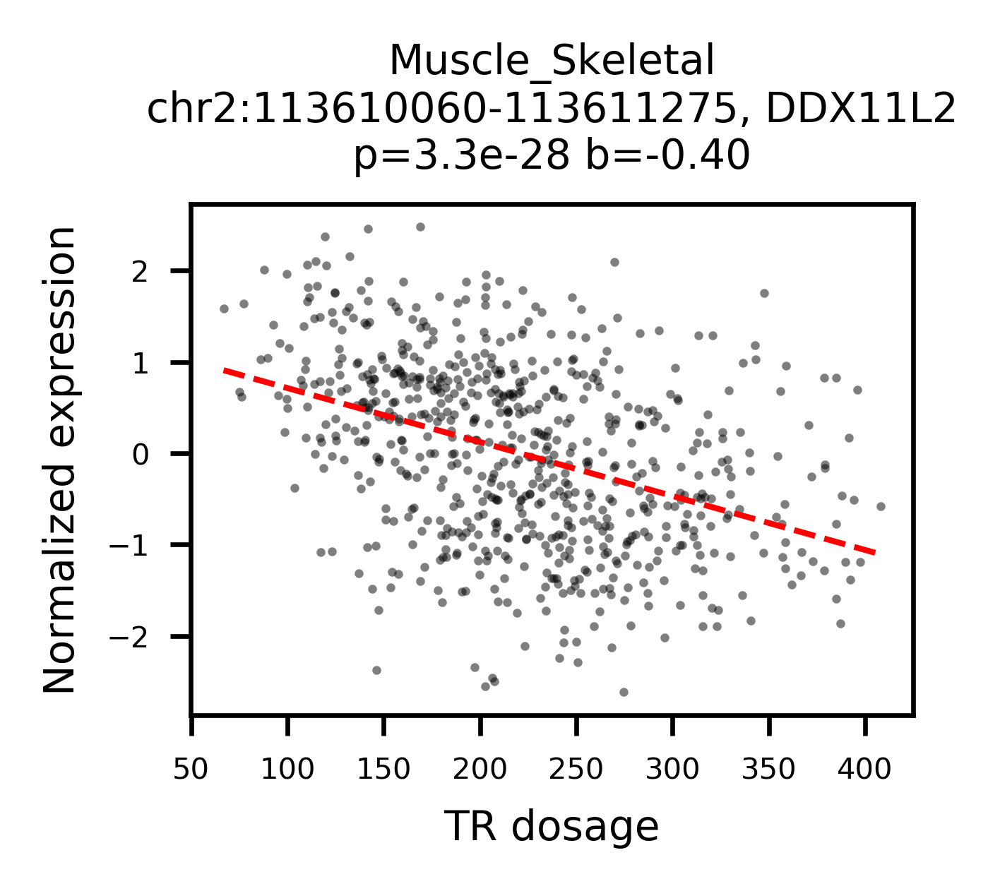

In [111]:
def test():
    for i in range(20):
        visSinglePair(epairs[i])
test()

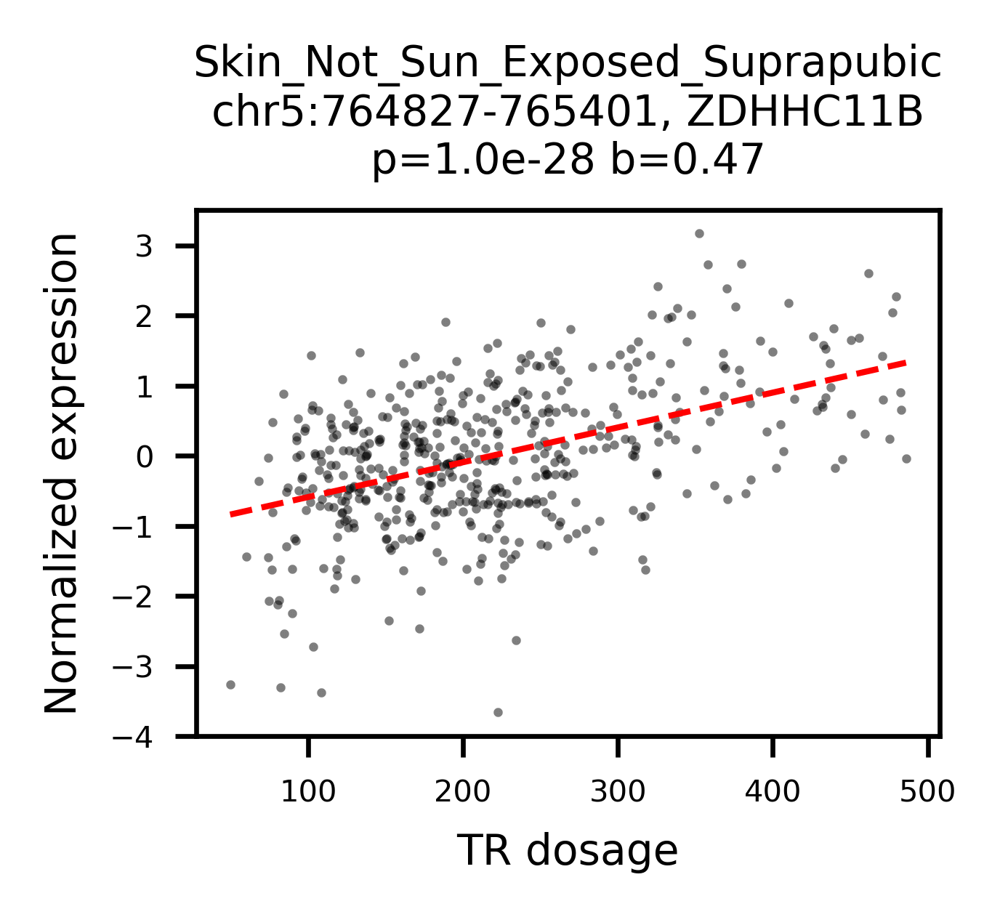

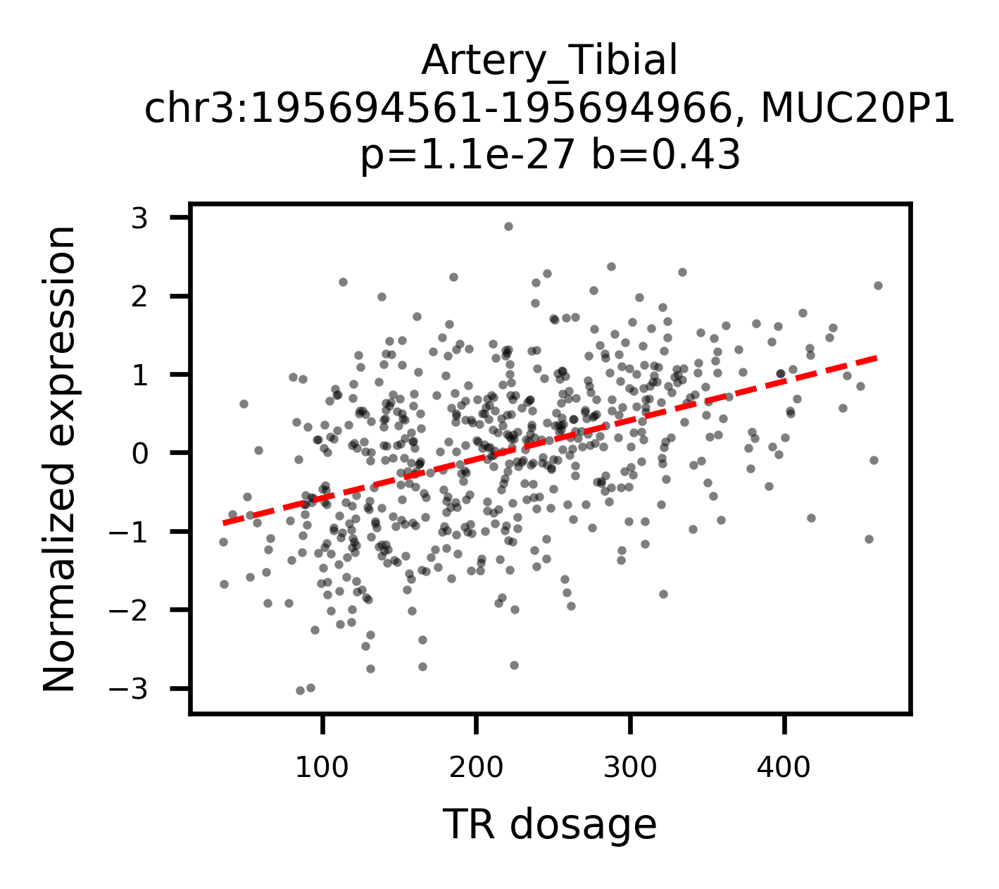

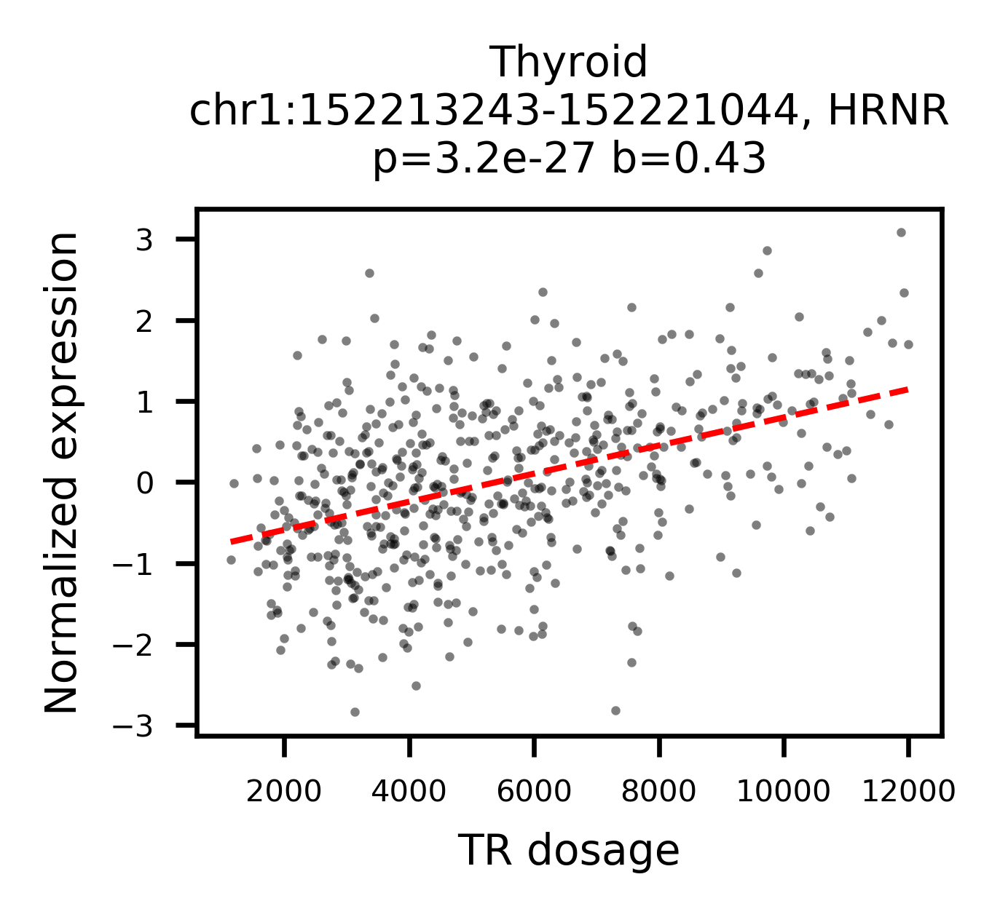

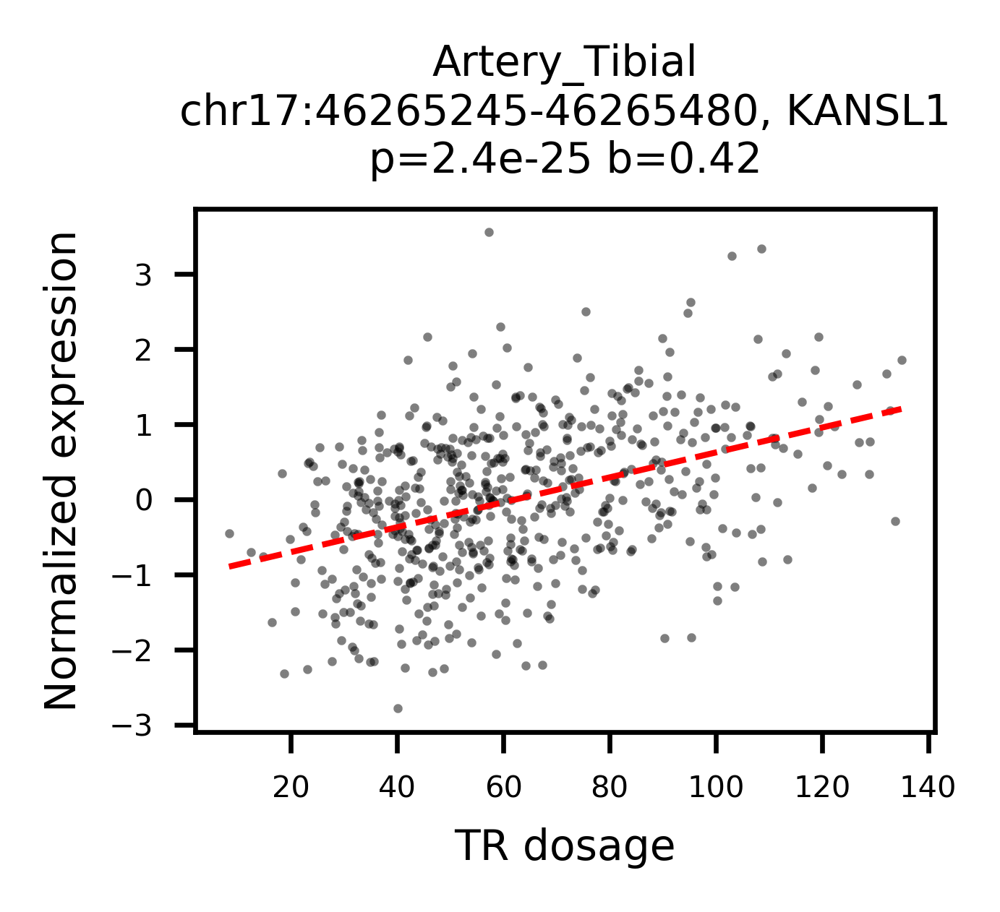

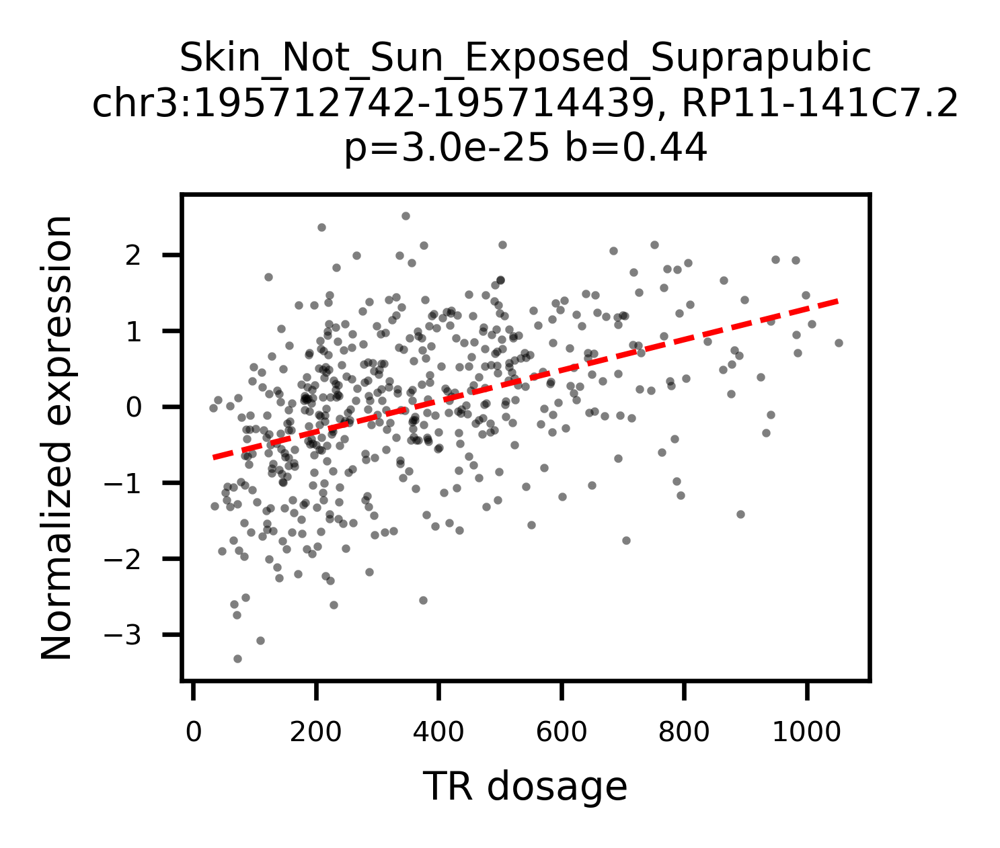

...

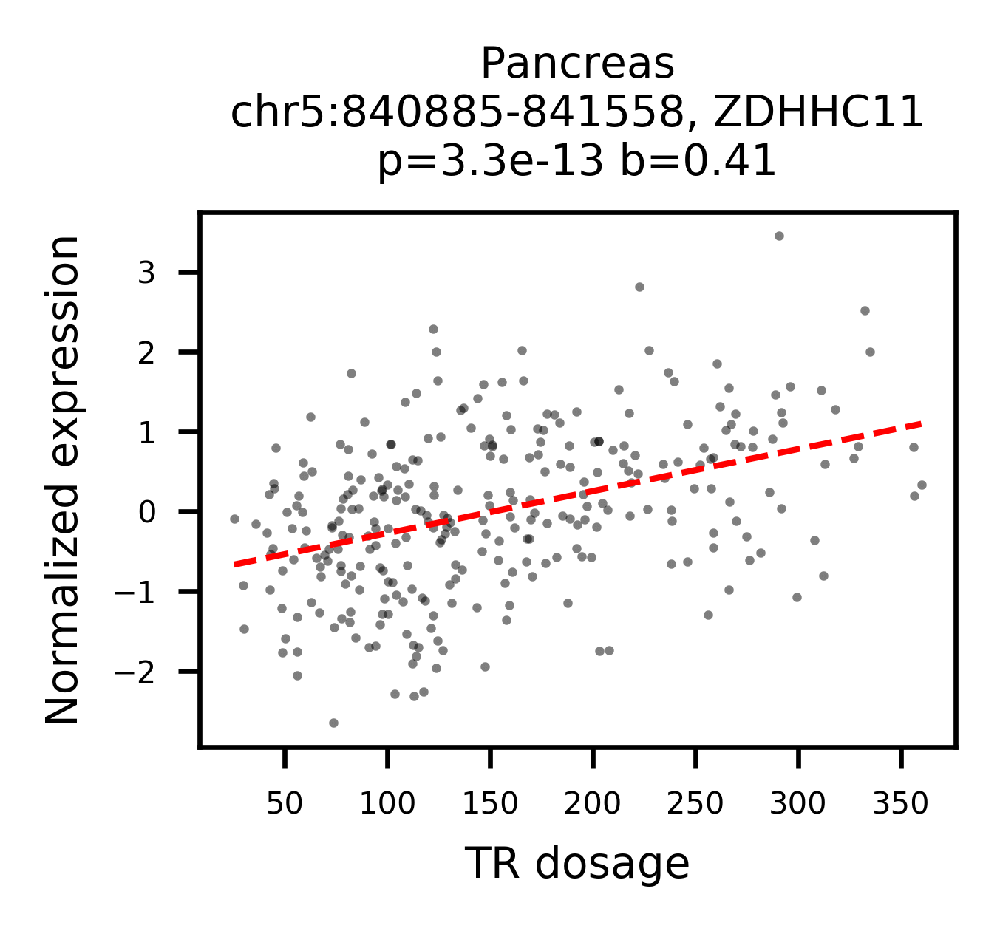

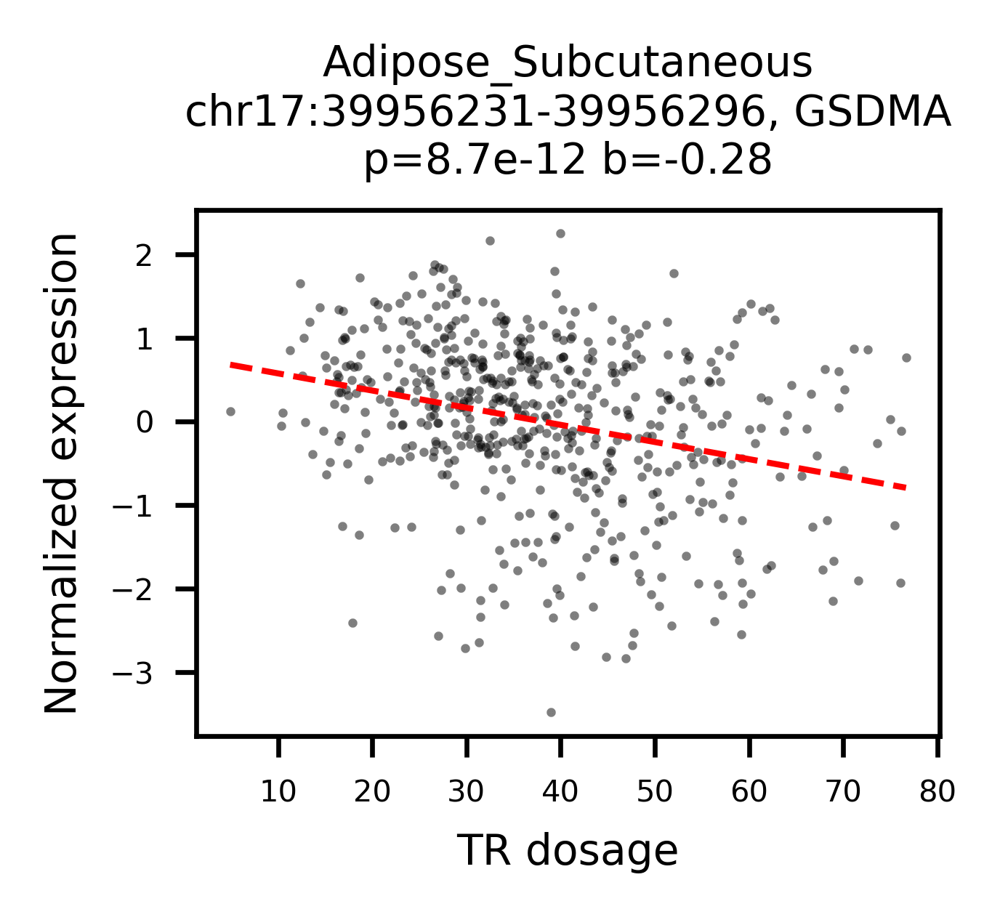

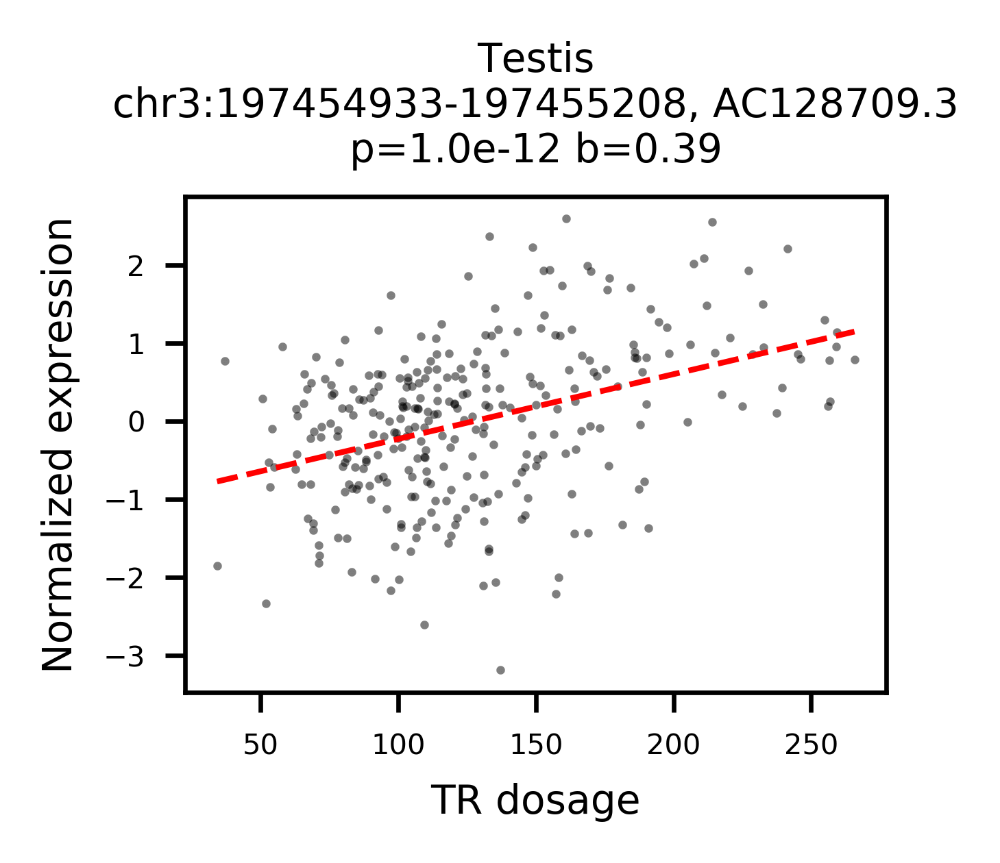

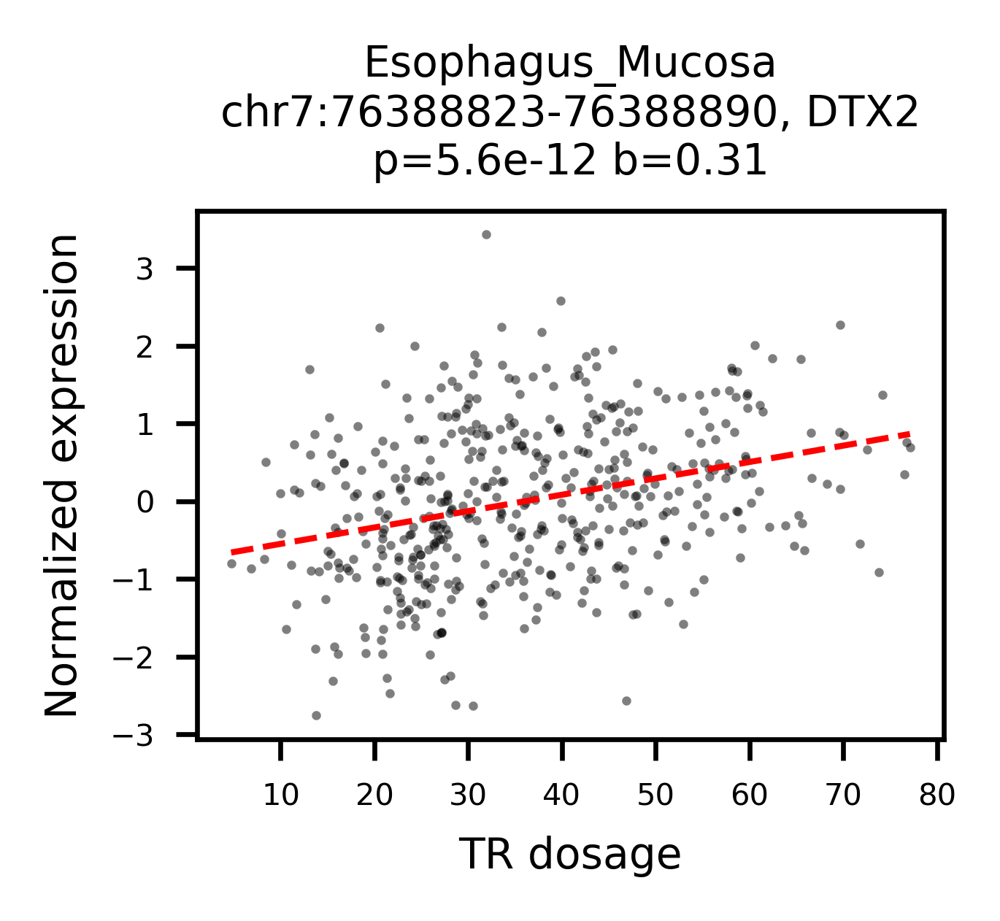

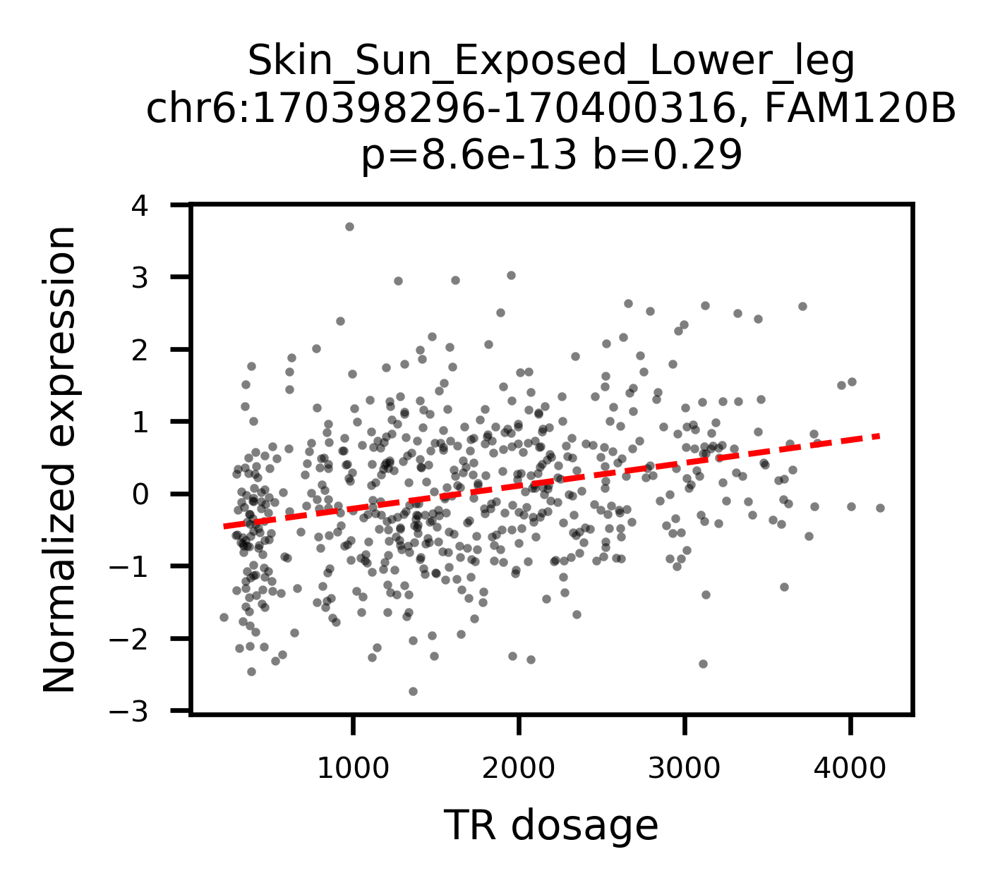

In [112]:
def test():
    for i in range(20,100):
        visSinglePair(epairs[i])
test()

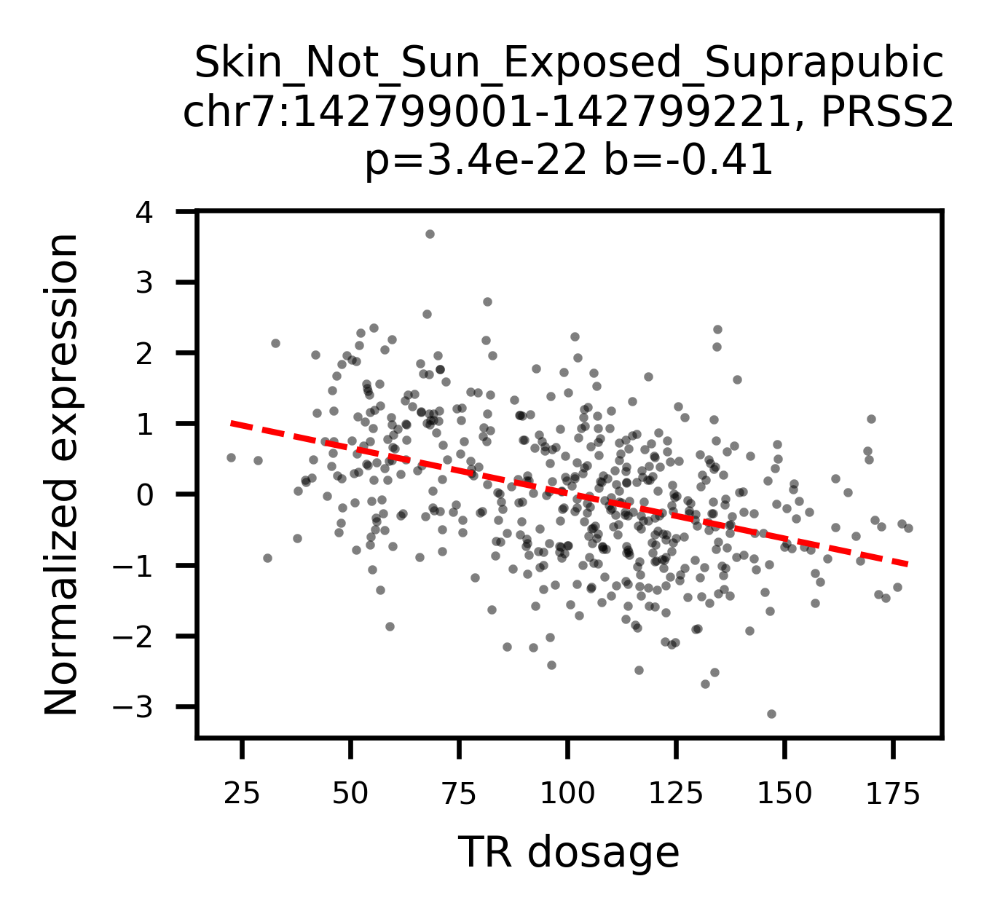

In [17]:
#Skin_Not_Sun_Exposed_Suprapubic
#ENSG00000275896.5
#25073
visSinglePair(epairs[6])

In [10]:
print("starting eQTL mapping")
writeAlleGeneTR(fdr_cutoff=0.01)

starting eQTL mapping
tissue: Adipose_Subcutaneous
	21242 TRs
	20471 Genes
	69481 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 581)
	tisResTpmMat (24665, 581)


/home/cmb-16/mjc/tsungyul/common/Miniconda3/envs/hapdb/lib/python3.7/site-packages/ipykernel_launcher.py:192: RuntimeWarning: invalid value encountered in true_divide


---------------------------------------
	120 tissue eGenes
tissue: Adipose_Visceral_Omentum
	21308 TRs
	20520 Genes
	69789 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 469)
	tisResTpmMat (24724, 469)
--------------------------------------
	86 tissue eGenes
tissue: Adrenal_Gland
	21003 TRs
	19847 Genes
	67599 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 233)
	tisResTpmMat (23820, 233)
---------------------------------------
	37 tissue eGenes
tissue: Artery_Aorta
	20814 TRs
	19869 Genes
	67084 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 387)
	tisResTpmMat (23959, 387)
-------------------------------------
	72 tissue eGenes
tissue: Artery_Coronary
	21149 TRs
	20369 Genes
	68823 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 213)
	tisResTpmMat (24529, 213)
--------------------------------------
	36 tissue eGenes
tissue: Artery_Tibial
	20774 TRs
	19364 Genes
	65452 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 584)
	tisResTpmMat (23304, 584)
-

In [45]:
# v0_wrong_proj FDR=0.01

starting eQTL mapping
tissue: Adipose_Subcutaneous
	21242 TRs
	20471 Genes
	69481 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 581)
	tisResTpmMat (24665, 581)


/home/cmb-16/mjc/tsungyul/common/Miniconda3/envs/hapdb/lib/python3.7/site-packages/ipykernel_launcher.py:192: RuntimeWarning: invalid value encountered in true_divide


---------------------------------------
	229 tissue eGenes
tissue: Adipose_Visceral_Omentum
	21308 TRs
	20520 Genes
	69789 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 469)
	tisResTpmMat (24724, 469)
--------------------------------------
	220 tissue eGenes
tissue: Adrenal_Gland
	21003 TRs
	19847 Genes
	67599 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 233)
	tisResTpmMat (23820, 233)
---------------------------------------
	15 tissue eGenes
tissue: Artery_Aorta
	20814 TRs
	19869 Genes
	67084 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 387)
	tisResTpmMat (23959, 387)
-------------------------------------
	166 tissue eGenes
tissue: Artery_Coronary
	21149 TRs
	20369 Genes
	68823 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 213)
	tisResTpmMat (24529, 213)
--------------------------------------
	7 tissue eGenes
tissue: Artery_Tibial
	20774 TRs
	19364 Genes
	65452 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 584)
	tisResTpmMat (23304, 584)


In [55]:
def counteTR(indir):
    eTRs = set()
    for f in sorted(glob.glob(f'{indir}/*.v8.egenes.txt')):
        tmp = set(np.loadtxt(f, usecols=9, dtype=int, ndmin=1).tolist())
        eTRs |= tmp
    print(len(eTRs))

In [56]:
counteTR("/home/cmb-17/mjc/vntr_genotyping/clinicGraph/eqtl/output/fdr1")

3631


/home/cmb-16/mjc/tsungyul/common/Miniconda3/envs/hapdb/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: loadtxt: Empty input file: "/home/cmb-17/mjc/vntr_genotyping/clinicGraph/eqtl/output/fdr1/Liver.v8.egenes.txt"
  after removing the cwd from sys.path.


In [57]:
counteTR("/home/cmb-17/mjc/vntr_genotyping/clinicGraph/eqtl/output/fdr5")

7551


In [58]:
counteTR("/home/cmb-17/mjc/vntr_genotyping/clinicGraph/eqtl/output/fdr10")

10435


In [11]:
print("starting eQTL mapping")
writeAlleGeneTR(fdr_cutoff=0.1)

starting eQTL mapping
tissue: Adipose_Subcutaneous
	21242 TRs
	20471 Genes
	69481 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 581)
	tisResTpmMat (24665, 581)


/home/cmb-16/mjc/tsungyul/common/Miniconda3/envs/hapdb/lib/python3.7/site-packages/ipykernel_launcher.py:192: RuntimeWarning: invalid value encountered in true_divide


---------------------------------------
	175 tissue eGenes
tissue: Adipose_Visceral_Omentum
	21308 TRs
	20520 Genes
	69789 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 469)
	tisResTpmMat (24724, 469)
--------------------------------------
	149 tissue eGenes
tissue: Adrenal_Gland
	21003 TRs
	19847 Genes
	67599 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 233)
	tisResTpmMat (23820, 233)
---------------------------------------
	58 tissue eGenes
tissue: Artery_Aorta
	20814 TRs
	19869 Genes
	67084 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 387)
	tisResTpmMat (23959, 387)
-------------------------------------
	102 tissue eGenes
tissue: Artery_Coronary
	21149 TRs
	20369 Genes
	68823 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 213)
	tisResTpmMat (24529, 213)
--------------------------------------
	54 tissue eGenes
tissue: Artery_Tibial
	20774 TRs
	19364 Genes
	65452 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 584)
	tisResTpmMat (23304, 584)

In [41]:
# v0_wrong_proj FDR=0.1

starting eQTL mapping
tissue: Adipose_Subcutaneous
	21242 TRs
	20471 Genes
	69481 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 581)
	tisResTpmMat (24665, 581)


/home/cmb-16/mjc/tsungyul/common/Miniconda3/envs/hapdb/lib/python3.7/site-packages/ipykernel_launcher.py:192: RuntimeWarning: invalid value encountered in true_divide


---------------------------------------
	1062 tissue eGenes
tissue: Adipose_Visceral_Omentum
	21308 TRs
	20520 Genes
	69789 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 469)
	tisResTpmMat (24724, 469)
--------------------------------------
	673 tissue eGenes
tissue: Adrenal_Gland
	21003 TRs
	19847 Genes
	67599 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 233)
	tisResTpmMat (23820, 233)
---------------------------------------
	180 tissue eGenes
tissue: Artery_Aorta
	20814 TRs
	19869 Genes
	67084 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 387)
	tisResTpmMat (23959, 387)
-------------------------------------
	823 tissue eGenes
tissue: Artery_Coronary
	21149 TRs
	20369 Genes
	68823 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 213)
	tisResTpmMat (24529, 213)
--------------------------------------
	125 tissue eGenes
tissue: Artery_Tibial
	20774 TRs
	19364 Genes
	65452 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 584)
	tisResTpmMat (23304, 5

In [104]:
# v2 filtering nsup
print("starting eQTL mapping")
writeAlleGeneTR()

starting eQTL mapping
tissue: Adipose_Subcutaneous
	20915 TRs
	20245 Genes
	68283 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 581)
	tisResTpmMat (24665, 581)

	91 tissue eGenes
tissue: Adipose_Visceral_Omentum
	20980 TRs
	20285 Genes
	68572 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 469)
	tisResTpmMat (24724, 469)

	72 tissue eGenes
tissue: Adrenal_Gland
	20679 TRs
	19624 Genes
	66445 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 233)
	tisResTpmMat (23820, 233)

	29 tissue eGenes
tissue: Artery_Aorta
	20494 TRs
	19644 Genes
	65913 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 387)
	tisResTpmMat (23959, 387)

	47 tissue eGenes
tissue: Artery_Coronary
	20819 TRs
	20139 Genes
	67617 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 213)
	tisResTpmMat (24529, 213)

	24 tissue eGenes
tissue: Artery_Tibial
	20452 TRs
	19146 Genes
	64311 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 584)
	tisResTpmMat (23304, 584)

	98 tissue eGenes
tissu

In [12]:
# v1 without filtering nsup

starting eQTL mapping
tissue: Adipose_Subcutaneous
	21242 TRs
	20471 Genes
	69481 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 581)
	tisResTpmMat (24665, 581)


/home/cmb-16/mjc/tsungyul/common/Miniconda3/envs/hapdb/lib/python3.7/site-packages/ipykernel_launcher.py:192: RuntimeWarning: invalid value encountered in true_divide


---------------------------------------
	154 tissue eGenes
tissue: Adipose_Visceral_Omentum
	21308 TRs
	20520 Genes
	69789 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 469)
	tisResTpmMat (24724, 469)
--------------------------------------
	134 tissue eGenes
tissue: Adrenal_Gland
	21003 TRs
	19847 Genes
	67599 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 233)
	tisResTpmMat (23820, 233)
---------------------------------------
	50 tissue eGenes
tissue: Artery_Aorta
	20814 TRs
	19869 Genes
	67084 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 387)
	tisResTpmMat (23959, 387)
-------------------------------------
	95 tissue eGenes
tissue: Artery_Coronary
	21149 TRs
	20369 Genes
	68823 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 213)
	tisResTpmMat (24529, 213)
--------------------------------------
	47 tissue eGenes
tissue: Artery_Tibial
	20774 TRs
	19364 Genes
	65452 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 584)
	tisResTpmMat (23304, 584)


In [31]:
# v0_wrong_proj FDR=0.05

starting eQTL mapping
tissue: Adipose_Subcutaneous
	21242 TRs
	20471 Genes
	69481 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 581)
	tisResTpmMat (24665, 581)


/home/cmb-16/mjc/tsungyul/common/Miniconda3/envs/hapdb/lib/python3.7/site-packages/ipykernel_launcher.py:192: RuntimeWarning: invalid value encountered in true_divide


---------------------------------------
	583 tissue eGenes
tissue: Adipose_Visceral_Omentum
	21308 TRs
	20520 Genes
	69789 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 469)
	tisResTpmMat (24724, 469)
--------------------------------------
	439 tissue eGenes
tissue: Adrenal_Gland
	21003 TRs
	19847 Genes
	67599 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 233)
	tisResTpmMat (23820, 233)
---------------------------------------
	95 tissue eGenes
tissue: Artery_Aorta
	20814 TRs
	19869 Genes
	67084 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 387)
	tisResTpmMat (23959, 387)
-------------------------------------
	490 tissue eGenes
tissue: Artery_Coronary
	21149 TRs
	20369 Genes
	68823 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 213)
	tisResTpmMat (24529, 213)
--------------------------------------
	46 tissue eGenes
tissue: Artery_Tibial
	20774 TRs
	19364 Genes
	65452 TR x Gene tests
	3.4 tests per gene
	tisGenMat (29117, 584)
	tisResTpmMat (23304, 584)

In [105]:
results = ctrleQTLv1()

tissue Adipose_Subcutaneous
	20915 TRs
	20245 Genes
	68283 TR x Gene tests
	3.4 tests per gene
	top GenMat (3415, 581)
	top ResTpmMat (3415, 581)

tissue Adipose_Visceral_Omentum
	20980 TRs
	20285 Genes
	68572 TR x Gene tests
	3.4 tests per gene
	top GenMat (3429, 469)
	top ResTpmMat (3429, 469)

tissue Adrenal_Gland
	20679 TRs
	19624 Genes
	66445 TR x Gene tests
	3.4 tests per gene
	top GenMat (3323, 233)
	top ResTpmMat (3323, 233)

tissue Artery_Aorta
	20494 TRs
	19644 Genes
	65913 TR x Gene tests
	3.4 tests per gene
	top GenMat (3296, 387)
	top ResTpmMat (3296, 387)

tissue Artery_Coronary
	20819 TRs
	20139 Genes
	67617 TR x Gene tests
	3.4 tests per gene
	top GenMat (3381, 213)
	top ResTpmMat (3381, 213)

tissue Artery_Tibial
	20452 TRs
	19146 Genes
	64311 TR x Gene tests
	3.4 tests per gene
	top GenMat (3216, 584)
	top ResTpmMat (3216, 584)

tissue Brain_Amygdala
	21779 TRs
	19936 Genes
	68584 TR x Gene tests
	3.4 tests per gene
	top GenMat (3430, 129)
	top ResTpmMat (3430, 129)



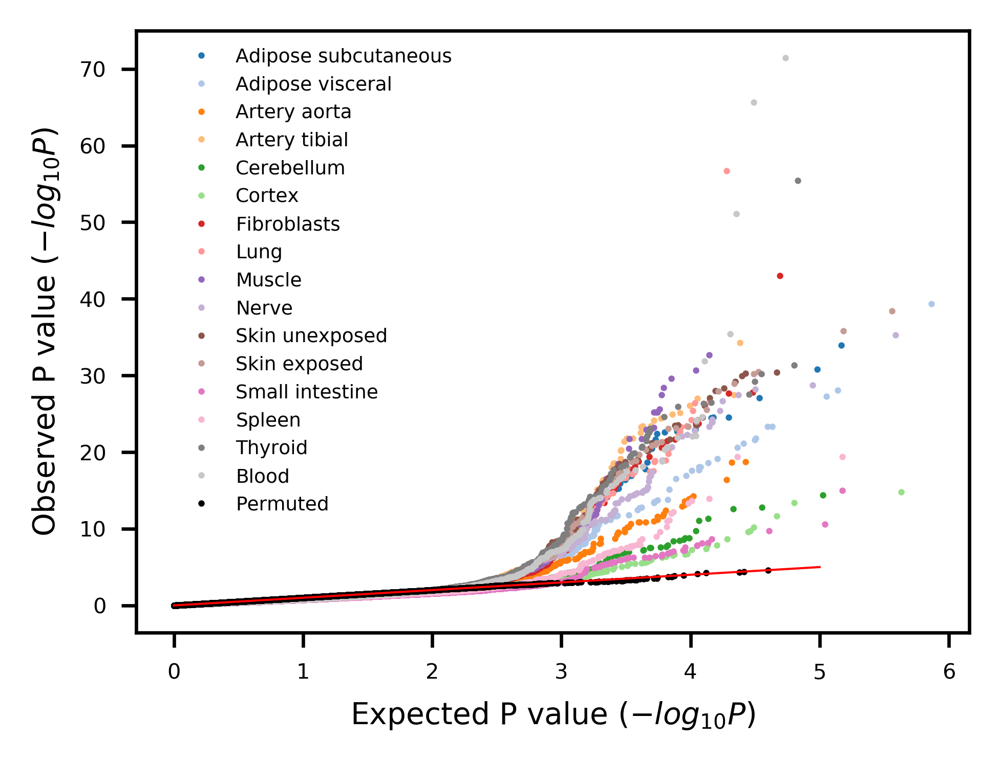

In [106]:
# v2
visQQ()

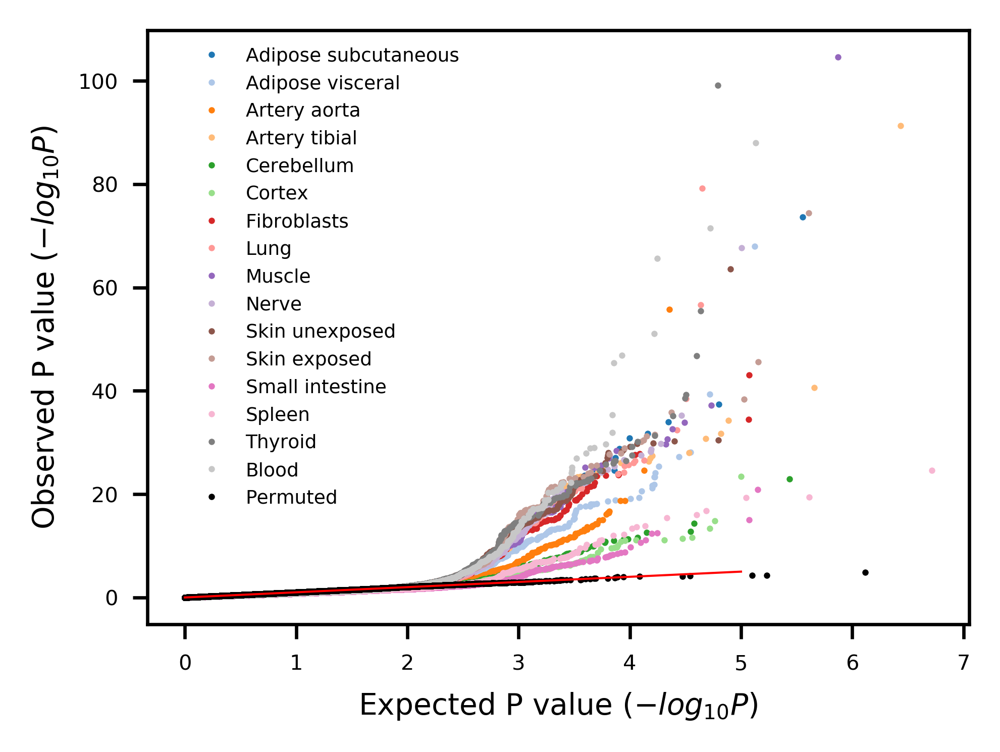

In [19]:
# v1 no filtering